# Linear Regression 

In [1]:
!pip install numpy==1.23.5
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf
import numpy as np
import pandas as pd





  Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.3 kB)
Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4


In [2]:
#read the dta file
score = pd.read_stata('Pay_by_Design_JOLE.dta') 





# Data Cleaning

In [3]:
##define different groups


response = ['z_final_score']

#treatments
inc_size = ['small','big']
inc_design= ['gains', 'p4p','levels']
control = ['any_incentive']

#X
base_covs = ['zmathbase1', 'zmathbase2']
other_covs = list('female stuage dad_jhs_yn mom_jhs_yn ses class_size teacher_experience teacher_basepay'.split())
item_difficulty = list('t_taught_any t_taught_easy t_taught_med t_taught_hard easyscore mediumscore hardscore'.split())
secondary_stu = list('secondary_stu math_self_concept math_anxiety math_intrin_mtv math_instr_mtv stu_time_math stu_percept_t_practice t_cares t_can_manage t_communicates parents_help_hmwk teacher_tutor_times substitute_time'.split())

#catogery
#catogery = ['countyid','treatment4groups','t_taught_easy','t_taught_med',
            #'t_taught_hard','va_tutor_norm_terc','pctrank_3bins','avg_pctrank_3bins']

category = ['countyid']

FE = ['schid']


#variable of interest
VoI = ['f_same_sex', 'm_same_sex']


In [4]:
#create D1 dummy variable =1 if the student's sex match teacher's sex

score['same_sex'] = ((score['female'] == score['t_female']) | (score['female'] + score['t_female'] == 0)).astype(int)


# Create the interaction term of D1x female = 1 if female the female student has a female teacher
score['f_same_sex'] = score['same_sex'] * score['female']



score['m_same_sex'] = ((score['same_sex'] == 1) & (score['female'] == 0)).astype(int)




score.shape


(9072, 61)

In [5]:
# Concatenate the lists
co_variates = base_covs + other_covs + FE 
dummies = category + inc_design+ VoI 


#oringinal covariates without VoI
old_confounders = base_covs + other_covs + FE+ category + inc_design
score_sub_old = score[old_confounders+response]
#score_sub_old = score_sub_old.dropna()
#score_sub_old.shape
#score_sub_old.columns

# all X + Y
sub_vars = co_variates+ dummies + response

In [6]:
score_sub1 = score[sub_vars]
score_sub1 = score_sub1.dropna()
score_sub1.shape

(7373, 18)

In [7]:
score_sub1.columns

Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'countyid', 'gains', 'p4p', 'levels',
       'f_same_sex', 'm_same_sex', 'z_final_score'],
      dtype='object')

In [8]:
score_sub_old.columns

Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'countyid', 'gains', 'p4p', 'levels',
       'z_final_score'],
      dtype='object')

In [9]:
score_sub_encoded = pd.get_dummies(score_sub_old, columns=['countyid'], drop_first=True)
#score_sub_encoded = score_sub_encoded.astype(int)
score_sub_encoded.columns
score_sub_encoded = score_sub_encoded.dropna()

In [10]:
#Treat Fixed effect on contunious variables
#score_cont = score_sub[co_variates]

#school_means = score_cont.groupby('schid').transform('mean')
#score_cont = score_cont - school_means
#score_cont.drop(columns='schid', inplace=True)
#score_transformed = score_cont

#score_transformed['z_final_score'] = score_sub['z_final_score']

#for i in dummies:
    #score_transformed[i] = score_sub[i]

# OLS Model


In [151]:
!pip install ISLP 
import statsmodels.api as sm
import sklearn.linear_model as lm
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
import warnings
import statsmodels.api as sm
from statsmodels.stats.outliers_influence \
import variance_inflation_factor as VIF
from statsmodels.stats.anova import anova_lm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
summarize,
poly)
# ignore potential convergence warnings; for some small penalty levels,
# tried out, optimization might not converge
warnings.simplefilter('ignore')

  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.57.1 requires numpy<1.25,>=1.21, but you have numpy 1.26.4 which is incompatible.


# original model with desgin

In [152]:
# design
design = MS(score_sub_encoded.columns.drop(response)).fit(score_sub_encoded) #specify a modelof X for transform
Y = np.array(score_sub_encoded['z_final_score'])
X = design.transform(score_sub_encoded) 






In [153]:
#y = y.reset_index(drop=True)
#X = X.reset_index(drop=True)


In [154]:
#clustered result all at once
model1 = sm.OLS(Y, X)
results1 = model1.fit(cov_type='cluster', cov_kwds={'groups': score_sub_encoded['schid']} )

summarize(results1)

,coef,std err,z,P>|z|
intercept,-53.391800,58.344000,-0.915,0.360
zmathbase1,0.317200,0.017000,18.952,0.000
zmathbase2,0.367500,0.015000,24.603,0.000
female,-0.141800,0.019000,-7.501,0.000
stuage,-0.098600,0.010000,-9.724,0.000
dad_jhs_yn,0.048000,0.018000,2.640,0.008
mom_jhs_yn,0.027900,0.021000,1.355,0.175
ses,0.003400,0.009000,0.362,0.717
class_size,0.003500,0.001000,2.353,0.019
teacher_experience,0.000016,0.002000,0.007,0.994


In [155]:
results11 = model1.fit()

clustered_results = results11.get_robustcov_results(cov_type='cluster', groups=score_sub_encoded['schid']) 
# seperate clustered and unclustered result
summarize(clustered_results)

,coef,std err,t,P>|t|
intercept,-53.391800,58.344000,-0.915,0.361
zmathbase1,0.317200,0.017000,18.952,0.000
zmathbase2,0.367500,0.015000,24.603,0.000
female,-0.141800,0.019000,-7.501,0.000
stuage,-0.098600,0.010000,-9.724,0.000
dad_jhs_yn,0.048000,0.018000,2.640,0.009
mom_jhs_yn,0.027900,0.021000,1.355,0.177
ses,0.003400,0.009000,0.362,0.718
class_size,0.003500,0.001000,2.353,0.020
teacher_experience,0.000016,0.002000,0.007,0.994


In [156]:
n_obs = clustered_results.nobs
print("Number of observations:", n_obs)

Number of observations: 7373.0


In [157]:
!pip install ISLP l0bnb
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
from statsmodels.api import OLS
import sklearn.model_selection as skm
import sklearn.linear_model as skl
from sklearn.preprocessing import StandardScaler
from ISLP import load_data
from ISLP.models import ModelSpec as MS
from functools import partial

from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from ISLP.models import \
     (Stepwise,
      sklearn_selected,
      sklearn_selection_path)
from l0bnb import fit_path

  Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4


In [158]:
D = design.fit_transform(score_sub_encoded)
D = D.drop('intercept', axis=1)
X = np.asarray(D)

In [159]:
Xs = X - X.mean(0)[None,:]
X_scale = X.std(0)
Xs = Xs / X_scale[None,:]
lambdas = 10**np.linspace(8, -2, 100) / Y.std()
soln_array = skl.ElasticNet.path(Xs,
                                 Y,
                                 l1_ratio=0.,
                                 alphas=lambdas)[1]
soln_array.shape

(29, 100)

In [160]:
soln_path = pd.DataFrame(soln_array.T,
                         columns=D.columns,
                         index=-np.log(lambdas))
soln_path.index.name = 'negative log(lambda)'
soln_path

,zmathbase1,zmathbase2,female,stuage,dad_jhs_yn,mom_jhs_yn,ses,class_size,teacher_experience,teacher_basepay,...,countyid_109,countyid_110,countyid_111,countyid_201,countyid_202,countyid_203,countyid_204,countyid_205,countyid_206,countyid_207
negative log(lambda),,,,,,,,,,,,,,,,,,,,,
-18.378537,6.058080e-09,6.452262e-09,-8.299859e-10,-3.117148e-09,1.256174e-09,1.453663e-09,1.414993e-09,6.363470e-10,-4.690712e-10,2.675557e-10,...,3.360864e-10,6.035351e-10,1.568241e-10,1.991180e-10,-1.257311e-09,-4.282266e-10,-1.838216e-09,-2.923032e-10,-1.007882e-09,7.099736e-10
-18.145953,7.644430e-09,8.141831e-09,-1.047323e-09,-3.933395e-09,1.585112e-09,1.834314e-09,1.785519e-09,8.029788e-10,-5.919007e-10,3.376171e-10,...,4.240930e-10,7.615749e-10,1.978896e-10,2.512584e-10,-1.586546e-09,-5.403607e-10,-2.319565e-09,-3.688448e-10,-1.271803e-09,8.958851e-10
-17.913368,9.646177e-09,1.027382e-08,-1.321572e-09,-4.963382e-09,2.000184e-09,2.314642e-09,2.253069e-09,1.013244e-09,-7.468940e-10,4.260244e-10,...,5.351446e-10,9.609985e-10,2.497083e-10,3.170522e-10,-2.001995e-09,-6.818579e-10,-2.926959e-09,-4.654293e-10,-1.604833e-09,1.130479e-09
-17.680784,1.217209e-08,1.296410e-08,-1.667635e-09,-6.263077e-09,2.523946e-09,2.920747e-09,2.843051e-09,1.278569e-09,-9.424733e-10,5.375818e-10,...,6.752759e-10,1.212643e-09,3.150962e-10,4.000744e-10,-2.526231e-09,-8.604070e-10,-3.693403e-09,-5.873052e-10,-2.025070e-09,1.426502e-09
-17.448200,1.535944e-08,1.635883e-08,-2.104317e-09,-7.903107e-09,3.184859e-09,3.685564e-09,3.587524e-09,1.613372e-09,-1.189266e-09,6.783513e-10,...,8.521016e-10,1.530181e-09,3.976063e-10,5.048367e-10,-3.187741e-09,-1.085711e-09,-4.660546e-09,-7.410951e-10,-2.555348e-09,1.800042e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3.716977,3.148708e-01,3.681934e-01,-6.963446e-02,-1.001552e-01,2.397788e-02,1.368457e-02,4.104115e-03,4.876382e-02,-2.722211e-03,-3.859560e-02,...,-9.921284e-03,4.846163e-02,2.165330e-02,9.719990e-03,-4.760156e-02,-4.567569e-02,-3.468544e-02,1.709234e-02,-4.597201e-02,6.616453e-04
3.949561,3.157079e-01,3.695982e-01,-6.993394e-02,-1.001954e-01,2.393192e-02,1.351913e-02,3.857812e-03,4.901074e-02,-2.531487e-03,-3.911302e-02,...,-1.002735e-02,4.875991e-02,2.180546e-02,9.663013e-03,-4.766917e-02,-4.596844e-02,-3.464946e-02,1.732289e-02,-4.607466e-02,4.353574e-04
4.182145,3.163727e-01,3.707222e-01,-7.017305e-02,-1.002258e-01,2.389502e-02,1.338645e-02,3.660140e-03,4.920950e-02,-2.376022e-03,-3.953112e-02,...,-1.011156e-02,4.899969e-02,2.192748e-02,9.606224e-03,-4.773459e-02,-4.621133e-02,-3.463317e-02,1.750070e-02,-4.616427e-02,2.438521e-04


In [161]:
soln_path.columns

Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'gains', 'p4p', 'levels', 'countyid_104',
       'countyid_105', 'countyid_106', 'countyid_107', 'countyid_108',
       'countyid_109', 'countyid_110', 'countyid_111', 'countyid_201',
       'countyid_202', 'countyid_203', 'countyid_204', 'countyid_205',
       'countyid_206', 'countyid_207'],
      dtype='object')

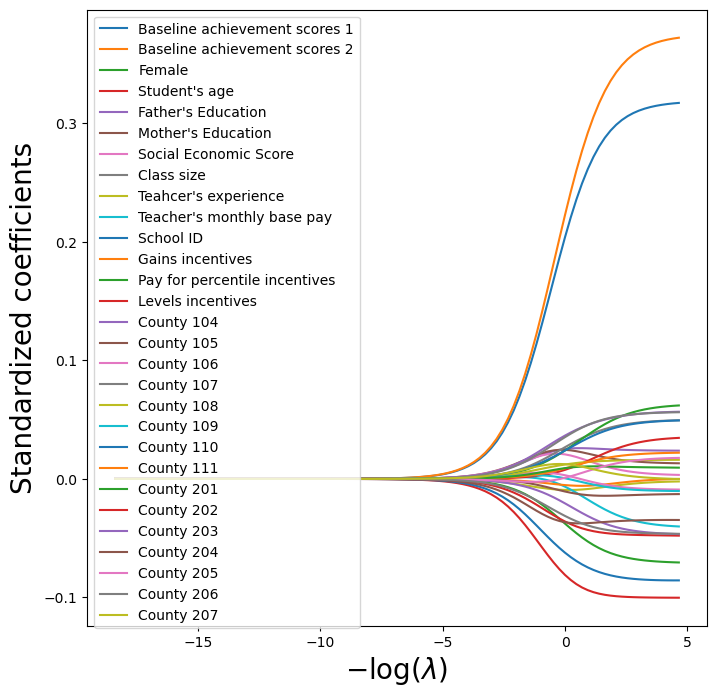

In [171]:
path_fig, ax = subplots(figsize=(8,8))
soln_path.plot(ax=ax, legend=False)
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)
labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ", "School ID", "Gains incentives",
         "Pay for percentile incentives", "Levels incentives", 'County 104',
       'County 105', 'County 106', 'County 107', 'County 108',
       'County 109', 'County 110', 'County 111', 'County 201',
       'County 202', 'County 203', 'County 204', 'County 205',
       'County 206', 'County 207']

ax.legend(labels, loc='upper left')

## All in one cross-validation fine tuning using 
# pipe

In [172]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)
scaler = StandardScaler(with_mean=True,  with_std=True)


In [173]:


ridgeCV = skl.ElasticNetCV(alphas=lambdas,
                           l1_ratio=0,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('ridge', ridgeCV)])
pipeCV.fit(X, Y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge',
                 ElasticNetCV(alphas=array([9.58731914e+07, 7.59778646e+07, 6.02111583e+07, 4.77163133e+07,
       3.78143622e+07, 2.99672354e+07, 2.37485216e+07, 1.88202972e+07,
       1.49147637e+07, 1.18196951e+07, 9.36690626e+06, 7.42311302e+06,
       5.88269012e+06, 4.66193132e+06, 3.69450084e+06, 2.92782874e+06,
       2.32025420e+06, 1.83876178e+06,...
       7.95956078e-01, 6.30781580e-01, 4.99883615e-01, 3.96149216e-01,
       3.13941479e-01, 2.48793253e-01, 1.97164398e-01, 1.56249414e-01,
       1.23824988e-01, 9.81291856e-02, 7.77657014e-02, 6.16279884e-02,
       4.88391269e-02, 3.87041728e-02, 3.06723951e-02, 2.43073485e-02,
       1.92631580e-02, 1.52657233e-02, 1.20978246e-02, 9.58731914e-03]),
                              cv=KFold(n_splits=5, random_state=0, shuffle=True),
                              l1_ratio=0))])

In [174]:
pipeCV.named_steps['ridge'].alpha_


0.015265723302095408

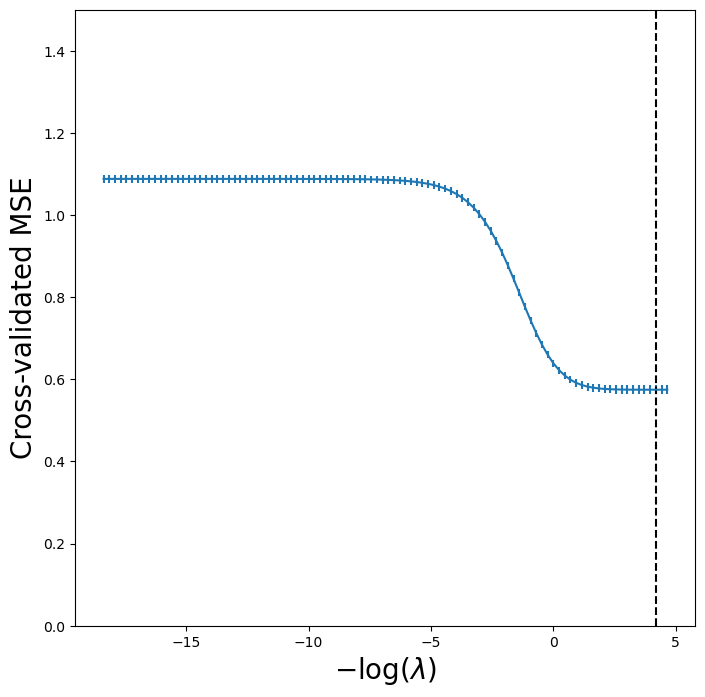

In [175]:
tuned_ridge = pipeCV.named_steps['ridge']
ridgeCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas),
            tuned_ridge.mse_path_.mean(1),
            yerr=tuned_ridge.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_ridge.alpha_), c='k', ls='--')
ax.set_ylim([0,1.5])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);


In [176]:
soln_path.columns


Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'gains', 'p4p', 'levels', 'countyid_104',
       'countyid_105', 'countyid_106', 'countyid_107', 'countyid_108',
       'countyid_109', 'countyid_110', 'countyid_111', 'countyid_201',
       'countyid_202', 'countyid_203', 'countyid_204', 'countyid_205',
       'countyid_206', 'countyid_207'],
      dtype='object')

In [177]:
soln_path.shape

(100, 29)

In [178]:
soln_path

,zmathbase1,zmathbase2,female,stuage,dad_jhs_yn,mom_jhs_yn,ses,class_size,teacher_experience,teacher_basepay,...,countyid_109,countyid_110,countyid_111,countyid_201,countyid_202,countyid_203,countyid_204,countyid_205,countyid_206,countyid_207
negative log(lambda),,,,,,,,,,,,,,,,,,,,,
-18.378537,6.058080e-09,6.452262e-09,-8.299859e-10,-3.117148e-09,1.256174e-09,1.453663e-09,1.414993e-09,6.363470e-10,-4.690712e-10,2.675557e-10,...,3.360864e-10,6.035351e-10,1.568241e-10,1.991180e-10,-1.257311e-09,-4.282266e-10,-1.838216e-09,-2.923032e-10,-1.007882e-09,7.099736e-10
-18.145953,7.644430e-09,8.141831e-09,-1.047323e-09,-3.933395e-09,1.585112e-09,1.834314e-09,1.785519e-09,8.029788e-10,-5.919007e-10,3.376171e-10,...,4.240930e-10,7.615749e-10,1.978896e-10,2.512584e-10,-1.586546e-09,-5.403607e-10,-2.319565e-09,-3.688448e-10,-1.271803e-09,8.958851e-10
-17.913368,9.646177e-09,1.027382e-08,-1.321572e-09,-4.963382e-09,2.000184e-09,2.314642e-09,2.253069e-09,1.013244e-09,-7.468940e-10,4.260244e-10,...,5.351446e-10,9.609985e-10,2.497083e-10,3.170522e-10,-2.001995e-09,-6.818579e-10,-2.926959e-09,-4.654293e-10,-1.604833e-09,1.130479e-09
-17.680784,1.217209e-08,1.296410e-08,-1.667635e-09,-6.263077e-09,2.523946e-09,2.920747e-09,2.843051e-09,1.278569e-09,-9.424733e-10,5.375818e-10,...,6.752759e-10,1.212643e-09,3.150962e-10,4.000744e-10,-2.526231e-09,-8.604070e-10,-3.693403e-09,-5.873052e-10,-2.025070e-09,1.426502e-09
-17.448200,1.535944e-08,1.635883e-08,-2.104317e-09,-7.903107e-09,3.184859e-09,3.685564e-09,3.587524e-09,1.613372e-09,-1.189266e-09,6.783513e-10,...,8.521016e-10,1.530181e-09,3.976063e-10,5.048367e-10,-3.187741e-09,-1.085711e-09,-4.660546e-09,-7.410951e-10,-2.555348e-09,1.800042e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3.716977,3.148708e-01,3.681934e-01,-6.963446e-02,-1.001552e-01,2.397788e-02,1.368457e-02,4.104115e-03,4.876382e-02,-2.722211e-03,-3.859560e-02,...,-9.921284e-03,4.846163e-02,2.165330e-02,9.719990e-03,-4.760156e-02,-4.567569e-02,-3.468544e-02,1.709234e-02,-4.597201e-02,6.616453e-04
3.949561,3.157079e-01,3.695982e-01,-6.993394e-02,-1.001954e-01,2.393192e-02,1.351913e-02,3.857812e-03,4.901074e-02,-2.531487e-03,-3.911302e-02,...,-1.002735e-02,4.875991e-02,2.180546e-02,9.663013e-03,-4.766917e-02,-4.596844e-02,-3.464946e-02,1.732289e-02,-4.607466e-02,4.353574e-04
4.182145,3.163727e-01,3.707222e-01,-7.017305e-02,-1.002258e-01,2.389502e-02,1.338645e-02,3.660140e-03,4.920950e-02,-2.376022e-03,-3.953112e-02,...,-1.011156e-02,4.899969e-02,2.192748e-02,9.606224e-03,-4.773459e-02,-4.621133e-02,-3.463317e-02,1.750070e-02,-4.616427e-02,2.438521e-04


In [179]:
v = ['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'gains', 'p4p', 'levels']


In [180]:
import matplotlib.pyplot as plt


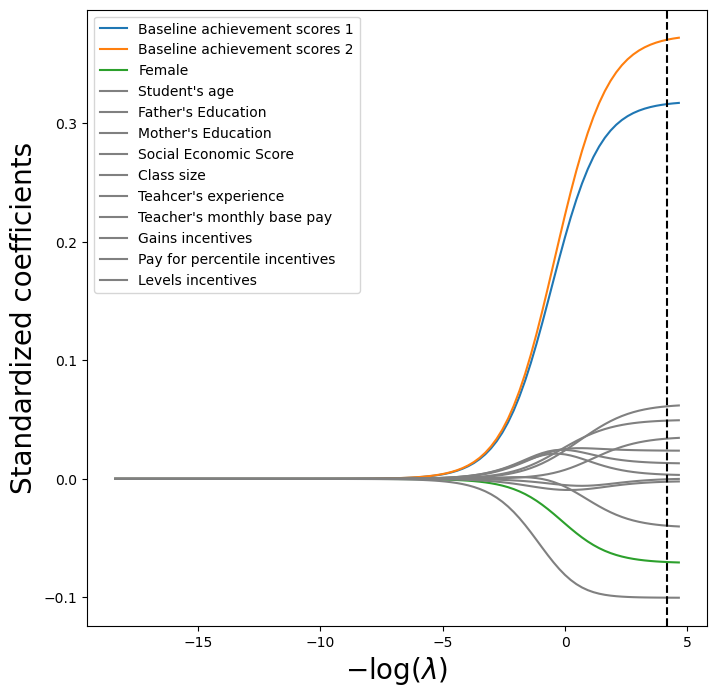

In [183]:
# Define which variables are less important
less_important_vars = ['ses' ,'class_size', 'teacher_experience', 'teacher_basepay',
                      'stuage', 'dad_jhs_yn','mom_jhs_yn', 'gains', 'p4p', 'levels']

# Plot each variable individually to control colors
path_fig, ax = plt.subplots(figsize=(8, 8))

for col in soln_path[v].columns:
    if col in less_important_vars:
        # Plot less important variables in gray
        soln_path[v][col].plot(ax=ax, color='gray', legend=False)
    else:
        # Plot important variables in different colors
        soln_path[v][col].plot(ax=ax, legend=False)



ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)
labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ",  "Gains incentives",
         "Pay for percentile incentives", "Levels incentives"]

ax.legend( labels, loc='upper left')

ax.axvline(-np.log(tuned_ridge.alpha_), c='k', ls='--')

# Original model LASSO

In [184]:

lambdas, soln_array = skl.Lasso.path(Xs, Y, l1_ratio=1, alphas=np.logspace(-4, 0, 100))[:2]





In [185]:
soln_path = pd.DataFrame(soln_array.T,
                         columns=D.columns,
                         index=-np.log(lambdas))
soln_path

,zmathbase1,zmathbase2,female,stuage,dad_jhs_yn,mom_jhs_yn,ses,class_size,teacher_experience,teacher_basepay,...,countyid_109,countyid_110,countyid_111,countyid_201,countyid_202,countyid_203,countyid_204,countyid_205,countyid_206,countyid_207
-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.0
0.093034,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.0
0.186067,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.0
0.279101,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.0
0.372135,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8.838205,0.318899,0.375061,-0.070946,-0.100224,0.023652,0.012811,0.002849,0.049781,-0.001693,-0.040999,...,-0.010228,0.049835,0.022298,0.009859,-0.047135,-0.046547,-0.033780,0.018498,-0.045919,0.0
8.931239,0.318901,0.375065,-0.070960,-0.100233,0.023660,0.012816,0.002852,0.049800,-0.001697,-0.041016,...,-0.010243,0.049848,0.022310,0.009867,-0.047152,-0.046561,-0.033794,0.018511,-0.045930,0.0
9.024273,0.318903,0.375069,-0.070972,-0.100242,0.023668,0.012820,0.002855,0.049818,-0.001702,-0.041031,...,-0.010256,0.049860,0.022321,0.009875,-0.047167,-0.046573,-0.033805,0.018523,-0.045938,0.0
9.117307,0.318904,0.375072,-0.070984,-0.100249,0.023675,0.012824,0.002858,0.049834,-0.001706,-0.041046,...,-0.010269,0.049871,0.022331,0.009883,-0.047180,-0.046583,-0.033814,0.018535,-0.045946,0.0


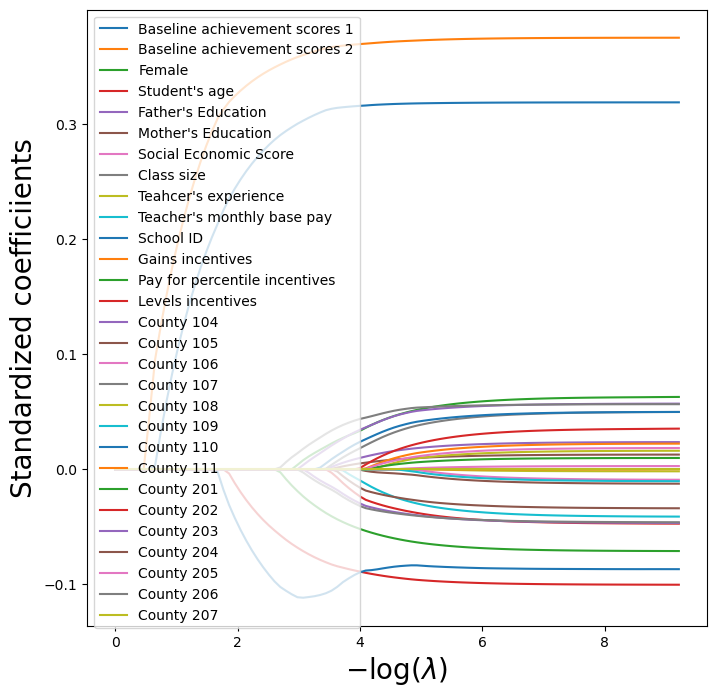

In [186]:
path_fig, ax = subplots(figsize=(8,8))
soln_path.plot(ax=ax, legend=False)
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficiients', fontsize=20);

#changing the name in the legend
labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ", "School ID", "Gains incentives",
         "Pay for percentile incentives", "Levels incentives", 'County 104',
       'County 105', 'County 106', 'County 107', 'County 108',
       'County 109', 'County 110', 'County 111', 'County 201',
       'County 202', 'County 203', 'County 204', 'County 205',
       'County 206', 'County 207']

ax.legend(labels, loc='upper left')



In [187]:
lassoCV = skl.ElasticNetCV(n_alphas=100,
                           l1_ratio=1,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('lasso', lassoCV)])
pipeCV.fit(X, Y)
tuned_lasso = pipeCV.named_steps['lasso']
tuned_lasso.alpha_

0.001532316748760332

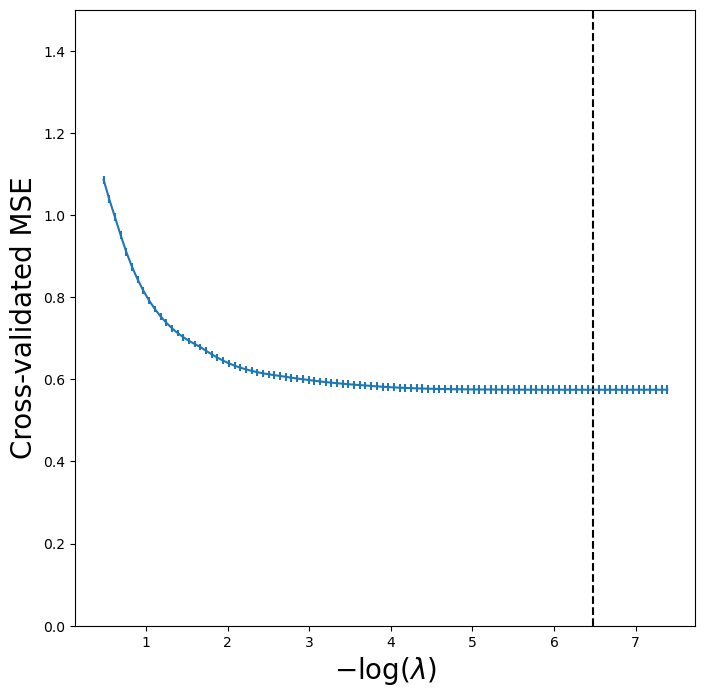

In [188]:
lassoCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(tuned_lasso.alphas_),
            tuned_lasso.mse_path_.mean(1),
            yerr=tuned_lasso.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_lasso.alpha_), c='k', ls='--')
ax.set_ylim([0,1.5])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);

In [189]:
soln_path.columns


Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'gains', 'p4p', 'levels', 'countyid_104',
       'countyid_105', 'countyid_106', 'countyid_107', 'countyid_108',
       'countyid_109', 'countyid_110', 'countyid_111', 'countyid_201',
       'countyid_202', 'countyid_203', 'countyid_204', 'countyid_205',
       'countyid_206', 'countyid_207'],
      dtype='object')

In [190]:
# take a subset of columns that excludes school and county dummies
v = ['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'gains', 'p4p', 'levels']

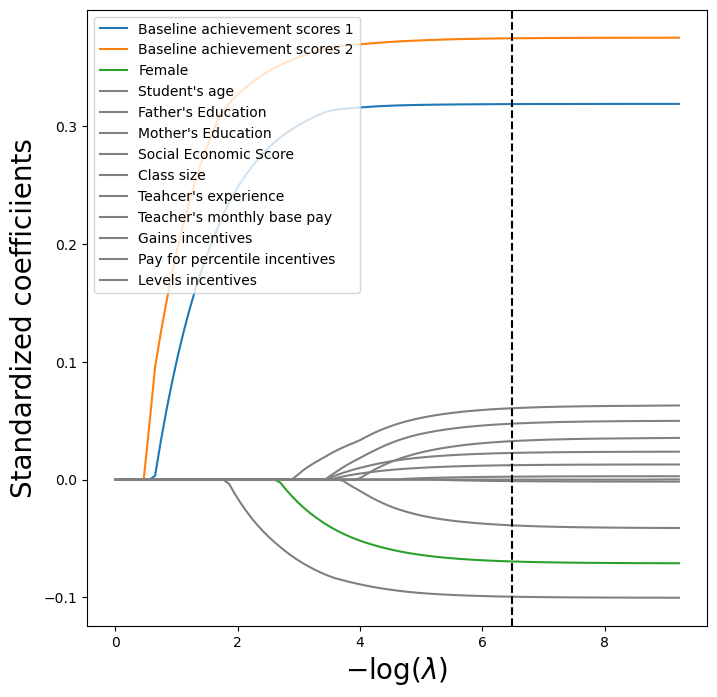

In [192]:
# Define which variables are less important
less_important_vars = ['ses' ,'class_size', 'teacher_experience', 'teacher_basepay',
                      'stuage', 'dad_jhs_yn','mom_jhs_yn',  'gains', 'p4p', 'levels']

# Plot each variable individually to control colors
path_fig, ax = plt.subplots(figsize=(8, 8))

for col in soln_path[v].columns:
    if col in less_important_vars:
        # Plot less important variables in gray
        soln_path[v][col].plot(ax=ax, color='gray', legend=False)
    else:
        # Plot important variables in different colors
        soln_path[v][col].plot(ax=ax, legend=False)

labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ",  "Gains incentives",
         "Pay for percentile incentives", "Levels incentives"]
ax.legend(labels, loc='upper left')
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.axvline(-np.log(tuned_lasso.alpha_), c='k', ls='--')
ax.set_ylabel('Standardized coefficiients', fontsize=20);

# VOI model 2.2 Female_Same_Sex + design

In [193]:
# design+ f_same_sex + interaction model sub df


score_sub_dfss = score[base_covs + other_covs + FE+ category 
                       + inc_design + [VoI[0]]+ [VoI[1]] + response]
score_sub_dfss = score_sub_dfss.dropna()

score_sub_dfss_encoded = pd.get_dummies(score_sub_dfss, columns=['countyid'], drop_first=True)

#score_sub_dfssi.columns

# design+ f_same_sex + interaction model specification

design_dfss = MS(score_sub_dfss_encoded.columns.drop(response)).fit(score_sub_dfss_encoded) #specify a modelof X for transform
y_dfss = np.array(score_sub_dfss_encoded['z_final_score'])
X_dfss = design_dfss.transform(score_sub_dfss_encoded) 

model_dfss = sm.OLS(y_dfss, X_dfss)
results_dfss = model_dfss.fit(cov_type='cluster', cov_kwds={'groups': score_sub_dfss_encoded['schid']})
summarize(results_dfss)

,coef,std err,z,P>|z|
intercept,-51.069100,58.185000,-0.878,0.380
zmathbase1,0.314500,0.017000,18.941,0.000
zmathbase2,0.366700,0.015000,24.605,0.000
female,-0.205800,0.047000,-4.354,0.000
stuage,-0.098600,0.010000,-9.665,0.000
dad_jhs_yn,0.045800,0.018000,2.502,0.012
mom_jhs_yn,0.028200,0.021000,1.374,0.169
ses,0.004200,0.009000,0.452,0.651
class_size,0.003200,0.002000,2.108,0.035
teacher_experience,0.000700,0.002000,0.294,0.769


In [194]:
results_dfss1 = model_dfss.fit()
clustered_results_dfss = results_dfss1.get_robustcov_results(cov_type='cluster', groups=score_sub_dfss_encoded['schid'])
#clustered_results_dfss_se = clustered_results_dfss.bse 
#se += clustered_results_dfss_se.tolist()
summarize(clustered_results_dfss)

,coef,std err,t,P>|t|
intercept,-51.069100,58.185000,-0.878,0.381
zmathbase1,0.314500,0.017000,18.941,0.000
zmathbase2,0.366700,0.015000,24.605,0.000
female,-0.205800,0.047000,-4.354,0.000
stuage,-0.098600,0.010000,-9.665,0.000
dad_jhs_yn,0.045800,0.018000,2.502,0.013
mom_jhs_yn,0.028200,0.021000,1.374,0.171
ses,0.004200,0.009000,0.452,0.652
class_size,0.003200,0.002000,2.108,0.036
teacher_experience,0.000700,0.002000,0.294,0.769


In [195]:
n_obs = clustered_results_dfss.nobs
print("Number of observations:", n_obs)

Number of observations: 7373.0


# DFSS Ridge

In [196]:
design= MS(score_sub_dfss_encoded.columns.drop(response)).fit(score_sub_dfss_encoded) #specify a modelof X for transform

D_dfss = design.fit_transform(score_sub_dfss_encoded)
D_dfss.columns


Index(['intercept', 'zmathbase1', 'zmathbase2', 'female', 'stuage',
       'dad_jhs_yn', 'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'gains', 'p4p', 'levels', 'f_same_sex',
       'm_same_sex', 'countyid_104', 'countyid_105', 'countyid_106',
       'countyid_107', 'countyid_108', 'countyid_109', 'countyid_110',
       'countyid_111', 'countyid_201', 'countyid_202', 'countyid_203',
       'countyid_204', 'countyid_205', 'countyid_206', 'countyid_207'],
      dtype='object')

In [197]:
D_dfss = D_dfss.drop('intercept', axis=1)
X_dfss = np.asarray(D_dfss)

In [198]:
Xs_dfss = X_dfss - X_dfss.mean(0)[None,:]
X_dfss_scale = X_dfss.std(0)
Xs_dfss = Xs_dfss / X_dfss_scale[None,:]
lambdas_dfss = 10**np.linspace(8, -2, 100) / y_dfss.std()
soln_array_dfss = skl.ElasticNet.path(Xs_dfss,
                                 y_dfss,
                                 l1_ratio=0.,
                                 alphas=lambdas_dfss)[1]
soln_array_dfss.shape

(31, 100)

In [199]:
soln_path_dfss = pd.DataFrame(soln_array_dfss.T,
                         columns=D_dfss.columns,
                         index=-np.log(lambdas_dfss))
soln_path_dfss.index.name = 'negative log(lambda)'

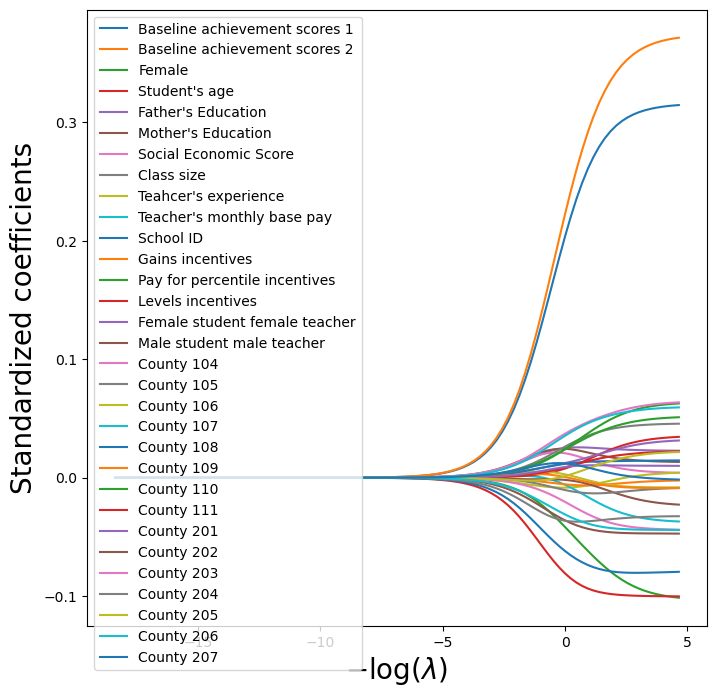

In [202]:
path_fig, ax = subplots(figsize=(8,8))
soln_path_dfss.plot(ax=ax, legend=False)
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)


labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ", "School ID", "Gains incentives",
         "Pay for percentile incentives", "Levels incentives", "Female student female teacher", 
          "Male student male teacher", 'County 104', 'County 105', 'County 106', 'County 107', 'County 108',
          'County 109', 'County 110', 'County 111', 'County 201', 'County 202', 'County 203', 'County 204', 
          'County 205', 'County 206', 'County 207']

ax.legend(labels, loc='upper left')

In [203]:

ridgeCV_dfss = skl.ElasticNetCV(alphas=lambdas_dfss,
                           l1_ratio=0,
                           cv=kfold)
pipeCV_dfss = Pipeline(steps=[('scaler', scaler),
                         ('ridge', ridgeCV_dfss)])
pipeCV_dfss.fit(X_dfss, y_dfss)

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge',
                 ElasticNetCV(alphas=array([9.58731914e+07, 7.59778646e+07, 6.02111583e+07, 4.77163133e+07,
       3.78143622e+07, 2.99672354e+07, 2.37485216e+07, 1.88202972e+07,
       1.49147637e+07, 1.18196951e+07, 9.36690626e+06, 7.42311302e+06,
       5.88269012e+06, 4.66193132e+06, 3.69450084e+06, 2.92782874e+06,
       2.32025420e+06, 1.83876178e+06,...
       7.95956078e-01, 6.30781580e-01, 4.99883615e-01, 3.96149216e-01,
       3.13941479e-01, 2.48793253e-01, 1.97164398e-01, 1.56249414e-01,
       1.23824988e-01, 9.81291856e-02, 7.77657014e-02, 6.16279884e-02,
       4.88391269e-02, 3.87041728e-02, 3.06723951e-02, 2.43073485e-02,
       1.92631580e-02, 1.52657233e-02, 1.20978246e-02, 9.58731914e-03]),
                              cv=KFold(n_splits=5, random_state=0, shuffle=True),
                              l1_ratio=0))])

In [204]:
pipeCV_dfss.named_steps['ridge'].alpha_

0.015265723302095408

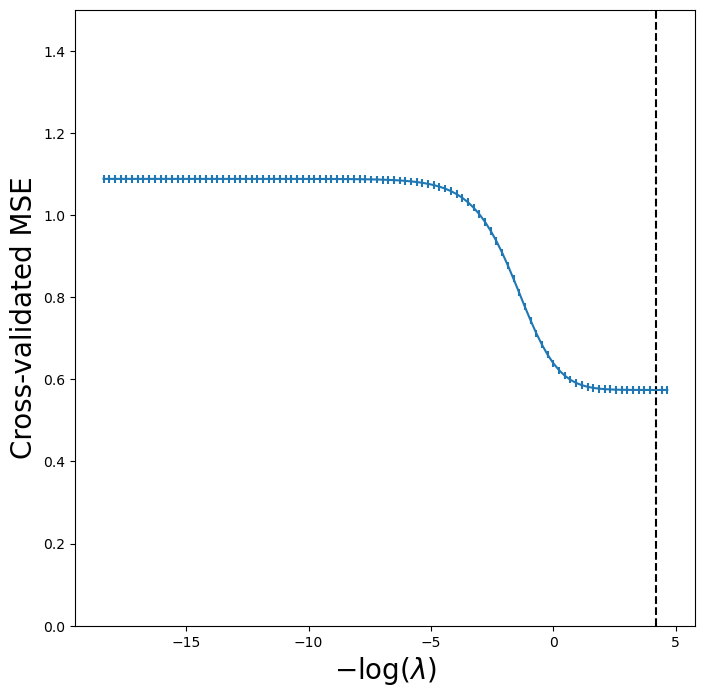

In [205]:
tuned_ridge = pipeCV_dfss.named_steps['ridge']
ridgeCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(lambdas_dfss),
            tuned_ridge.mse_path_.mean(1),
            yerr=tuned_ridge.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_ridge.alpha_), c='k', ls='--')
ax.set_ylim([0,1.5])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);

In [206]:
soln_path_dfss.columns


Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'gains', 'p4p', 'levels', 'f_same_sex',
       'm_same_sex', 'countyid_104', 'countyid_105', 'countyid_106',
       'countyid_107', 'countyid_108', 'countyid_109', 'countyid_110',
       'countyid_111', 'countyid_201', 'countyid_202', 'countyid_203',
       'countyid_204', 'countyid_205', 'countyid_206', 'countyid_207'],
      dtype='object')

In [214]:
v = ['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'gains', 'p4p', 'levels', 'f_same_sex',
       'm_same_sex']

In [215]:
import matplotlib.pyplot as plt


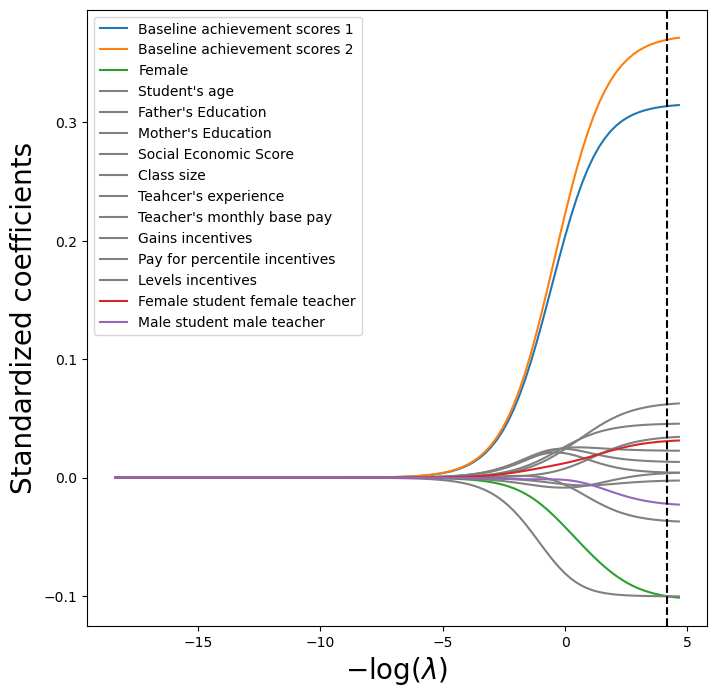

In [216]:
# Define which variables are less important
less_important_vars = ['ses' ,'class_size', 'teacher_experience', 'teacher_basepay',
                      'stuage', 'dad_jhs_yn','mom_jhs_yn',  'gains', 'p4p', 'levels']

# Plot each variable individually to control colors
path_fig, ax = plt.subplots(figsize=(8, 8))

for col in soln_path_dfss[v].columns:
    if col in less_important_vars:
        # Plot less important variables in gray
        soln_path_dfss[v][col].plot(ax=ax, color='gray', legend=False)
    else:
        # Plot important variables in different colors
        soln_path_dfss[v][col].plot(ax=ax, legend=False)

ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)


labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ", "Gains incentives",
         "Pay for percentile incentives", "Levels incentives", "Female student female teacher", 
          "Male student male teacher"]

ax.legend(labels, loc='upper left')
ax.axvline(-np.log(pipeCV_dfss.named_steps['ridge'].alpha_), c='k', ls='--')


# DFSS LASSO

In [217]:
lambdas_dfss_L, soln_array_dfss_L = skl.Lasso.path(X_dfss, y_dfss, l1_ratio=1, alphas=np.logspace(-4, 0, 100))[:2]


In [218]:
soln_path_dfss_L = pd.DataFrame(soln_array_dfss_L.T,
                         columns=D_dfss.columns,
                         index=-np.log(lambdas_dfss_L))

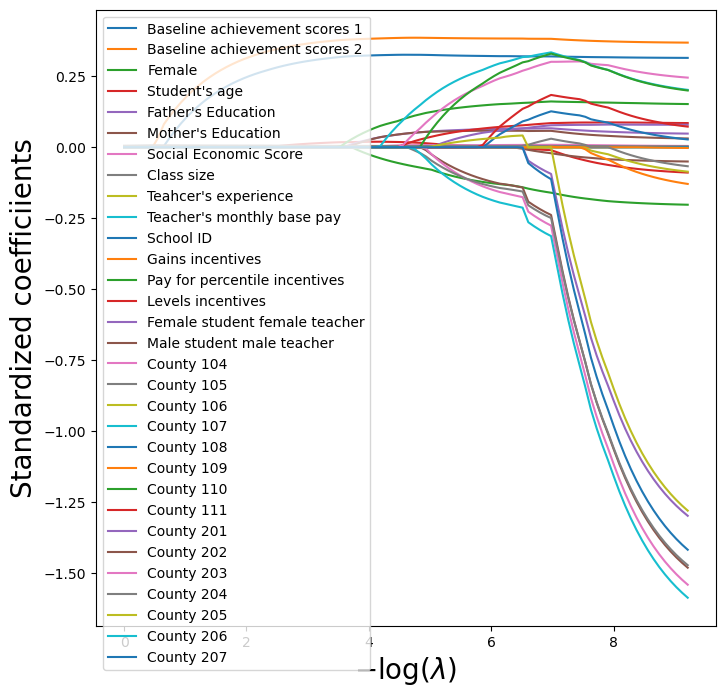

In [219]:
path_fig, ax = subplots(figsize=(8,8))
soln_path_dfss_L.plot(ax=ax, legend=False)
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficiients', fontsize=20);

labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ", "School ID", "Gains incentives",
         "Pay for percentile incentives", "Levels incentives", "Female student female teacher", 
          "Male student male teacher", 'County 104', 'County 105', 'County 106', 'County 107', 'County 108',
          'County 109', 'County 110', 'County 111', 'County 201', 'County 202', 'County 203', 'County 204', 
          'County 205', 'County 206', 'County 207']

ax.legend(labels, loc='upper left')

In [220]:
lassoCV_dfss = skl.ElasticNetCV(n_alphas=100,
                           l1_ratio=1,
                           cv=kfold)
pipeCV = Pipeline(steps=[('scaler', scaler),
                         ('lasso', lassoCV_dfss)])
pipeCV.fit(X_dfss, y_dfss)
tuned_lasso_dfss = pipeCV.named_steps['lasso']
tuned_lasso_dfss.alpha_

0.0012429093574549193

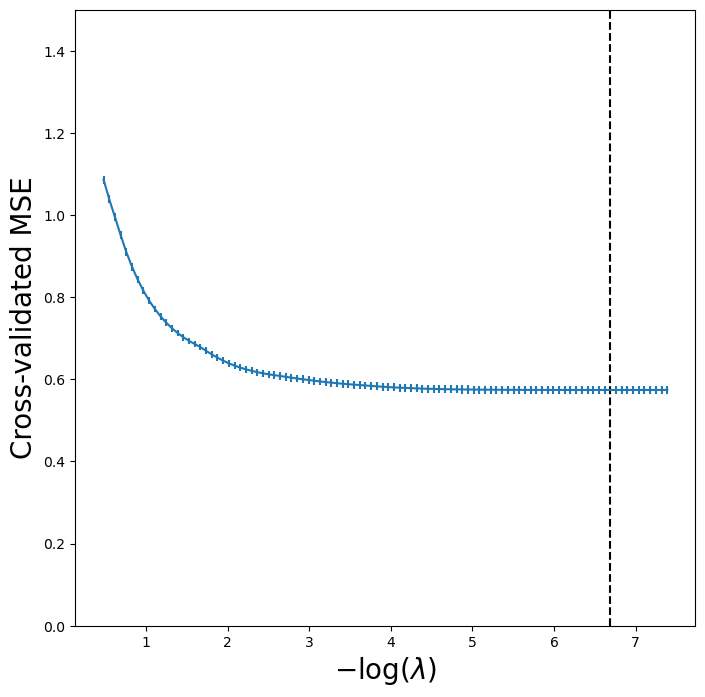

In [221]:
lassoCV_fig, ax = subplots(figsize=(8,8))
ax.errorbar(-np.log(tuned_lasso_dfss.alphas_),
            tuned_lasso_dfss.mse_path_.mean(1),
            yerr=tuned_lasso_dfss.mse_path_.std(1) / np.sqrt(K))
ax.axvline(-np.log(tuned_lasso_dfss.alpha_), c='k', ls='--')
ax.set_ylim([0,1.5])
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Cross-validated MSE', fontsize=20);

In [222]:
soln_path_dfss_L.columns


Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay', 'schid', 'gains', 'p4p', 'levels', 'f_same_sex',
       'm_same_sex', 'countyid_104', 'countyid_105', 'countyid_106',
       'countyid_107', 'countyid_108', 'countyid_109', 'countyid_110',
       'countyid_111', 'countyid_201', 'countyid_202', 'countyid_203',
       'countyid_204', 'countyid_205', 'countyid_206', 'countyid_207'],
      dtype='object')

In [223]:
v = ['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay',  'gains', 'p4p', 'levels', 
     'f_same_sex','m_same_sex']


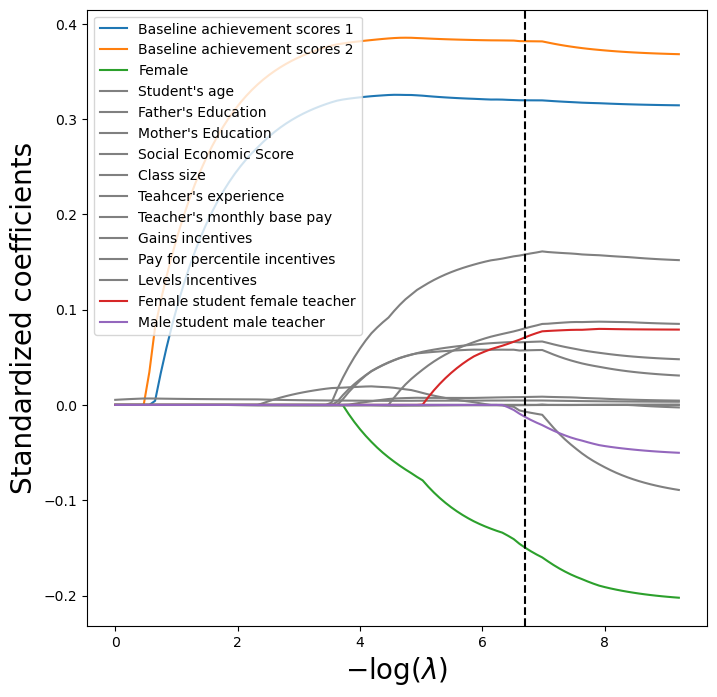

In [226]:



# Define which variables are less important
less_important_vars = ['ses' ,'class_size', 'teacher_experience', 'teacher_basepay',
                      'stuage', 'dad_jhs_yn','mom_jhs_yn',  'gains', 'p4p', 'levels']

# Plot each variable individually to control colors
path_fig, ax = plt.subplots(figsize=(8, 8))

for col in soln_path_dfss_L[v].columns:
    if col in less_important_vars:
        # Plot less important variables in gray
        soln_path_dfss_L[v][col].plot(ax=ax, color='gray', legend=False)
    else:
        # Plot important variables in different colors
        soln_path_dfss_L[v][col].plot(ax=ax, legend=False)
        
        
ax.set_xlabel('$-\log(\lambda)$', fontsize=20)
ax.set_ylabel('Standardized coefficients', fontsize=20)
ax.legend(loc='upper left')
ax.axvline(-np.log(tuned_lasso_dfss.alpha_), c='k', ls='--')

labels = ['Baseline achievement scores 1', 'Baseline achievement scores 2', 'Female', "Student's age",
         'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
         "Teahcer's experience", "Teacher's monthly base pay ",  "Gains incentives",
         "Pay for percentile incentives", "Levels incentives", "Female student female teacher", 
          "Male student male teacher"]

ax.legend(labels, loc='upper left')
plt.show()

# OLS Graphic Output

In [63]:
!pip install stargazer
from stargazer.stargazer import Stargazer


  Using cached stargazer-0.0.7-py3-none-any.whl.metadata (6.3 kB)
Using cached stargazer-0.0.7-py3-none-any.whl (15 kB)


In [64]:
import pandas as pd

In [65]:
stargazer1 = Stargazer([ results1, results_dfss,])

In [66]:
stargazer1

In [67]:
stargazer2 = Stargazer([ results11, results_dfss1])

In [68]:
stargazer2

In [69]:
stargazer2.covariate_order(['female','f_same_sex','m_same_sex'])
stargazer2.rename_covariates({'female': 'Female','f_same_sex': 'Female student female teacher',
                              'm_same_sex':'Male student male teacher'})


#stargazer2.custom_columns(['Female Students 1', 'Female Students 1',
                          # 'Same Sex Teachers 1', 'Same Sex Teachers 2' ,
                           #'Female Students Female Teachers 1', 'Female Students Female Teachers 2' , ])
#stargazer1.add_line('Time Effects', ['Yes', 'Yes', 'Yes'])
#stargazer1.add_line('Fixed Effects', ['No', 'No', 'Yes'])

In [70]:
stargazer1.covariate_order(['female','f_same_sex','m_same_sex'])
stargazer1.rename_covariates({'female': 'Female','f_same_sex': 'Female student female teacher',
                              'm_same_sex':'Male student male teacher'})


#stargazer1.custom_columns(['Female Students 1', 'Female Students 1',
                          # 'Same Sex Teachers 1', 'Same Sex Teachers 2' ,
                           #'Female Students Female Teachers 1', 'Female Students Female Teachers 2' , ])
#stargazer1.add_line('Time Effects', ['Yes', 'Yes', 'Yes'])
#stargazer1.add_line('Fixed Effects', ['No', 'No', 'Yes'])


In [71]:
#clustered
stargazer1

In [72]:
stargazer1.render_latex()

'\\begin{table}[!htbp] \\centering\n\\begin{tabular}{@{\\extracolsep{5pt}}lcc}\n\\\\[-1.8ex]\\hline\n\\hline \\\\[-1.8ex]\n& \\multicolumn{2}{c}{\\textit{Dependent variable: y}} \\\n\\cr \\cline{2-3}\n\\\\[-1.8ex] & (1) & (2) \\\\\n\\hline \\\\[-1.8ex]\n Female & -0.142$^{***}$ & -0.206$^{***}$ \\\\\n& (0.019) & (0.047) \\\\\n Female student female teacher & & 0.078$^{*}$ \\\\\n& & (0.047) \\\\\n Male student male teacher & & -0.052$^{}$ \\\\\n& & (0.049) \\\\\n\\hline \\\\[-1.8ex]\n Observations & 7373 & 7373 \\\\\n $R^2$ & 0.476 & 0.477 \\\\\n Adjusted $R^2$ & 0.474 & 0.475 \\\\\n Residual Std. Error & 0.756 (df=7343) & 0.756 (df=7341) \\\\\n F Statistic & 137.696$^{***}$ (df=29; 7343) & 130.007$^{***}$ (df=31; 7341) \\\\\n\\hline\n\\hline \\\\[-1.8ex]\n\\textit{Note:} & \\multicolumn{2}{r}{$^{*}$p$<$0.1; $^{**}$p$<$0.05; $^{***}$p$<$0.01} \\\\\n\\end{tabular}\n\\end{table}'

In [73]:
stargazer2
#clustering make insignificant, this is unclustered result

In [74]:
stargazer2.render_latex()

'\\begin{table}[!htbp] \\centering\n\\begin{tabular}{@{\\extracolsep{5pt}}lcc}\n\\\\[-1.8ex]\\hline\n\\hline \\\\[-1.8ex]\n& \\multicolumn{2}{c}{\\textit{Dependent variable: y}} \\\n\\cr \\cline{2-3}\n\\\\[-1.8ex] & (1) & (2) \\\\\n\\hline \\\\[-1.8ex]\n Female & -0.142$^{***}$ & -0.206$^{***}$ \\\\\n& (0.018) & (0.027) \\\\\n Female student female teacher & & 0.078$^{***}$ \\\\\n& & (0.027) \\\\\n Male student male teacher & & -0.052$^{**}$ \\\\\n& & (0.027) \\\\\n\\hline \\\\[-1.8ex]\n Observations & 7373 & 7373 \\\\\n $R^2$ & 0.476 & 0.477 \\\\\n Adjusted $R^2$ & 0.474 & 0.475 \\\\\n Residual Std. Error & 0.756 (df=7343) & 0.756 (df=7341) \\\\\n F Statistic & 230.266$^{***}$ (df=29; 7343) & 216.034$^{***}$ (df=31; 7341) \\\\\n\\hline\n\\hline \\\\[-1.8ex]\n\\textit{Note:} & \\multicolumn{2}{r}{$^{*}$p$<$0.1; $^{**}$p$<$0.05; $^{***}$p$<$0.01} \\\\\n\\end{tabular}\n\\end{table}'

# Regression Tree for base model

In [10]:
!pip install ISLP l0bnb

from sklearn.tree import (DecisionTreeClassifier as DTC,
                          DecisionTreeRegressor as DTR,
                          plot_tree,
                          export_text)
from sklearn.metrics import (accuracy_score,
                             log_loss)
from sklearn.ensemble import \
     (RandomForestRegressor as RF,
      GradientBoostingRegressor as GBR)
from ISLP.models import ModelSpec as MS



  Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5


In [11]:
# converting schid into dummies for better interpertation
score_sub_dfss = score[base_covs + other_covs + FE+ category 
                       + inc_design + [VoI[0]]+ [VoI[1]] + response]
score_sub_dfss_encoded2 = pd.get_dummies(score_sub_dfss, columns=['countyid',"schid"], drop_first=True)
score_sub_dfss_encoded2 = score_sub_dfss_encoded2.dropna()

In [12]:
score_sub_dfss_encoded2.columns

Index(['zmathbase1', 'zmathbase2', 'female', 'stuage', 'dad_jhs_yn',
       'mom_jhs_yn', 'ses', 'class_size', 'teacher_experience',
       'teacher_basepay',
       ...
       'schid_207031', 'schid_207032', 'schid_207041', 'schid_207051',
       'schid_207061', 'schid_207071', 'schid_207081', 'schid_207082',
       'schid_207091', 'schid_207092'],
      dtype='object', length=246)

In [13]:
model = MS(score_sub_dfss_encoded2.columns.drop('z_final_score'), intercept=False)
D = model.fit_transform(score_sub_dfss_encoded2)
feature_names = list(D.columns)
X = np.asarray(D)

In [14]:
import sklearn.model_selection as skm

(X_train,
 X_test,
 y_train,
 y_test) = skm.train_test_split(X,
                                score_sub_dfss_encoded2['z_final_score'],
                                test_size=0.3,
                                random_state=0)

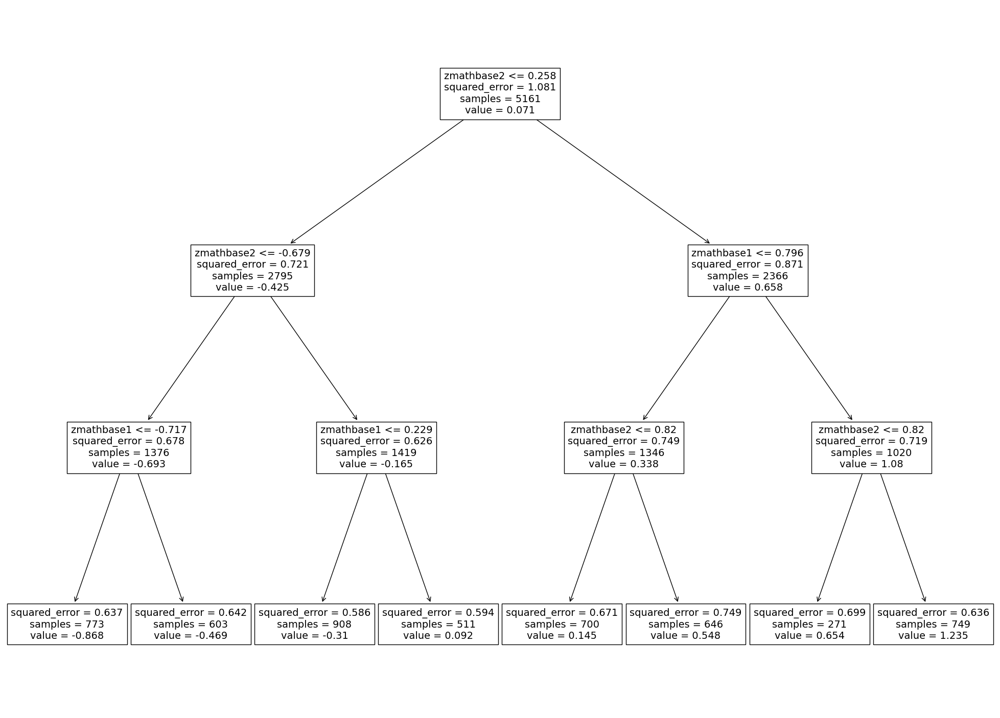

In [15]:
from matplotlib.pyplot import subplots

reg = DTR(max_depth=3)
reg.fit(X_train, y_train)
ax = subplots(figsize=(25,18))[1]
plot_tree(reg,
          feature_names=feature_names,
          ax=ax);


In [16]:

# Calculate MSE
np.mean((y_test - reg.predict(X_test))**2)

0.677289636055437

In [20]:
ccp_path = reg.cost_complexity_pruning_path(X_train, y_train)
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10],
    'max_features': ['sqrt', 'log2', None],
    'ccp_alpha': ccp_path.ccp_alphas,
}



In [21]:
#cross-validation tree pruning.
kfold = skm.KFold(5,
                  shuffle=True,
                  random_state=10)
grid = skm.GridSearchCV(reg,
                        param_grid,
                        refit=True,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
G = grid.fit(X_train, y_train)
print("Best Parameters:", grid.best_params_)
print("Best Score:", -grid.best_score_)
print("Best Estimator:", grid.best_estimator_)


Best Parameters: {'ccp_alpha': 0.0, 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 20}
Best Score: 0.6432900877257536
Best Estimator: DecisionTreeRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=20)


In [22]:
best_ = grid.best_estimator_
np.mean((y_test - best_.predict(X_test))**2)
#cross validation MSE

0.6548378403300656

In [ ]:
ax = subplots(figsize=(25,40))[1]
plot_tree(G.best_estimator_,
          feature_names=feature_names,
          ax=ax);

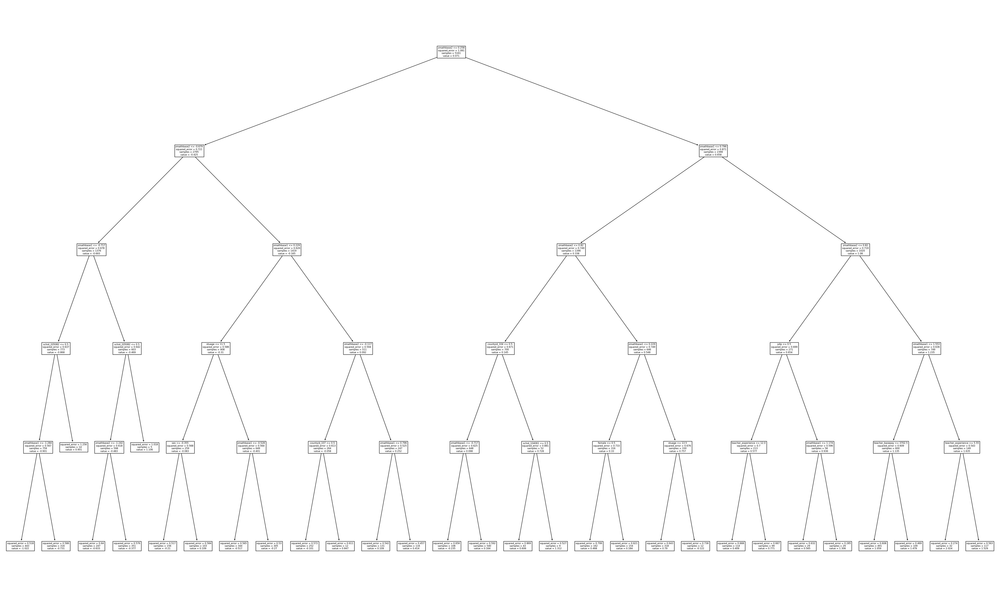

In [20]:
# best estimator

reg1 = DTR(max_depth=5, min_samples_leaf = 5,min_samples_split= 20 )
reg1.fit(X_train, y_train)
ax = subplots(figsize=(50,30))[1]
plot_tree(reg1,
          feature_names=feature_names,
          ax=ax);

# Bagging and RF Base Model

In [21]:
bag_score = RF(max_features=X_train.shape[1], random_state=0)
bag_score.fit(X_train, y_train)


RandomForestRegressor(max_features=245, random_state=0)

0.5754497021177482

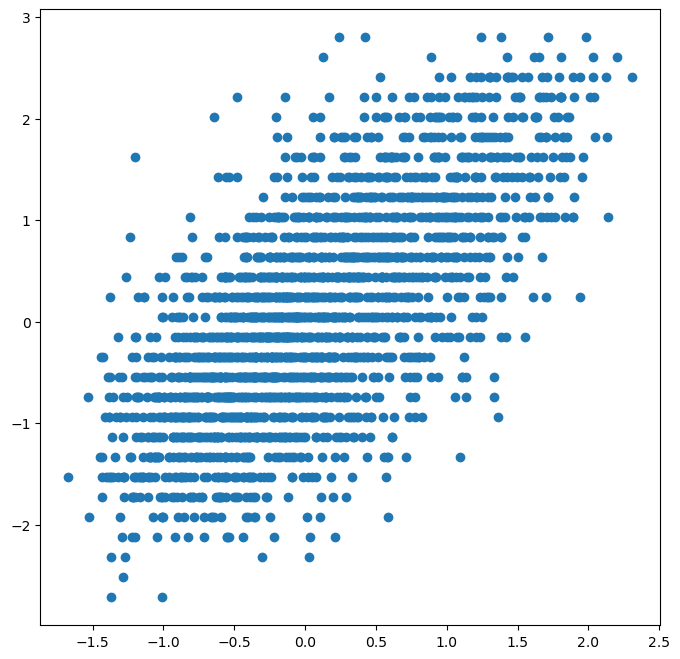

In [22]:
#normal bagging MSE
from matplotlib.pyplot import subplots

ax = subplots(figsize=(8,8))[1]
y_hat_bag = bag_score.predict(X_test)
ax.scatter(y_hat_bag, y_test)
np.mean((y_test - y_hat_bag)**2)

In [23]:
#using all predcitors but with more trees
#checking change in MSE
bag_score = RF(max_features=X_train.shape[1],
                n_estimators=500,
                random_state=0).fit(X_train, y_train)
y_hat_bag = bag_score.predict(X_test)
np.mean((y_test - y_hat_bag)**2)

0.5702230513845813

In [24]:

param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'max_depth': [1, 3,5,10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
}


In [29]:
#cross-validation tree pruning.
kfold = skm.KFold(5,
                  shuffle=True,
                  random_state=10)

grid = skm.GridSearchCV(
    estimator=bag_score,
    param_grid=param_grid,
    cv=kfold,
    scoring='neg_mean_squared_error',
    verbose=2,
    n_jobs=-1
)

grid.fit(X_train, y_train)
grid.fit(X_train, y_train)
print("Best Parameters:", grid.best_params_)
print("Best Score:", -grid.best_score_)
print("Best Estimator:", grid.best_estimator_)


Fitting 5 folds for each of 810 candidates, totalling 4050 fits
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.3s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.3s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.4s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; tota

In [30]:
print("Best Parameters:", grid.best_params_)


Best Parameters: {'max_depth': 20, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 500}


In [31]:
best_ = grid.best_estimator_
np.mean((y_test - best_.predict(X_test))**2)
#cross validation MSE

0.5652251829575883

In [26]:
#best bagging estimator
bag_score_best = RF(max_depth = 20, max_features = None, min_samples_leaf = 1, min_samples_split = 10, n_estimators = 500)
bag_score_best.fit(X_train, y_train)

RandomForestRegressor(max_depth=20, max_features=None, min_samples_split=10,
                      n_estimators=500)

In [32]:
feature_imp = pd.DataFrame(
    {'importance':best_.feature_importances_},
    index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

,importance
zmathbase2,4.093733e-01
zmathbase1,1.541218e-01
ses,5.557747e-02
teacher_basepay,3.924635e-02
class_size,3.765027e-02
...,...
schid_108011,2.281036e-05
schid_109063,2.239988e-05
schid_110101,7.037560e-07
schid_101161,0.000000e+00


In [33]:
latex = feature_imp.sort_values(by='importance', ascending=False).style.to_latex()
print(latex)

\begin{tabular}{lr}
 & importance \\
zmathbase2 & 0.409373 \\
zmathbase1 & 0.154122 \\
ses & 0.055577 \\
teacher_basepay & 0.039246 \\
class_size & 0.037650 \\
teacher_experience & 0.034000 \\
stuage & 0.028833 \\
schid_205082 & 0.014652 \\
schid_107081 & 0.007588 \\
female & 0.007333 \\
countyid_104 & 0.006508 \\
schid_107092 & 0.006437 \\
dad_jhs_yn & 0.005773 \\
mom_jhs_yn & 0.005282 \\
countyid_107 & 0.004820 \\
p4p & 0.004554 \\
schid_201027 & 0.004370 \\
countyid_202 & 0.004105 \\
gains & 0.004075 \\
countyid_203 & 0.003893 \\
m_same_sex & 0.003471 \\
f_same_sex & 0.003383 \\
countyid_201 & 0.003103 \\
levels & 0.003069 \\
schid_104061 & 0.002873 \\
countyid_204 & 0.002847 \\
countyid_205 & 0.002775 \\
schid_111011 & 0.002611 \\
schid_202034 & 0.002609 \\
countyid_106 & 0.002527 \\
countyid_206 & 0.002464 \\
countyid_110 & 0.002190 \\
schid_202092 & 0.002069 \\
schid_111021 & 0.002055 \\
schid_101171 & 0.002029 \\
countyid_111 & 0.002029 \\
countyid_105 & 0.001932 \\
schid_104021

# Boosting

In [28]:
boost_score = GBR(n_estimators=5000,
                   learning_rate=0.001,
                   max_depth=3,
                   random_state=0)
boost_score.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=0.001, n_estimators=5000,
                          random_state=0)

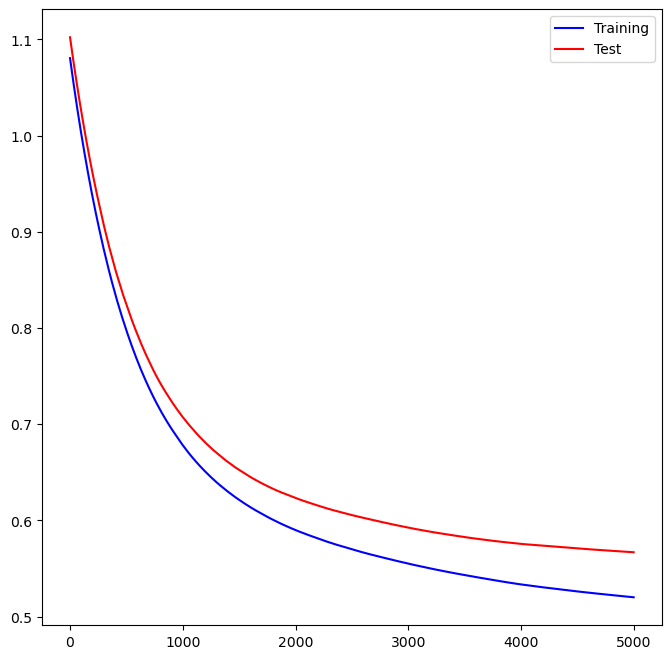

In [29]:
#
test_error = np.zeros_like(boost_score.train_score_)
for idx, y_ in enumerate(boost_score.staged_predict(X_test)):
   test_error[idx] = np.mean((y_test - y_)**2)

plot_idx = np.arange(boost_score.train_score_.shape[0])
ax = subplots(figsize=(8,8))[1]
ax.plot(plot_idx,
        boost_score.train_score_,
        'b',
        label='Training')
ax.plot(plot_idx,
        test_error,
        'r',
        label='Test')
ax.legend();

#MSE error y-axis

In [30]:
#predicting y hat
y_hat_boost = boost_score.predict(X_test);
np.mean((y_test - y_hat_boost)**2)


0.5668804508324884

In [31]:
#fine tunning the number of trees =1000
boost_score = GBR(n_estimators=500,
                   learning_rate=0.02,
                   max_depth=3,
                   random_state=0)
boost_score.fit(X_train,
                 y_train)
y_hat_boost = boost_score.predict(X_test);
np.mean((y_test - y_hat_boost)**2)

0.5460907890645083

In [39]:
#fine tunning the learning rate  = 0.2
boost_score = GBR(n_estimators=500,
                   learning_rate=0.05,
                   max_depth=3,
                   random_state=0)
boost_score.fit(X_train,
                 y_train)
y_hat_boost = boost_score.predict(X_test);
np.mean((y_test - y_hat_boost)**2)

0.5345751828173436

# DAG model for GM 

In [11]:
!pip install dowhy -q

import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import graphviz
import networkx as nx
import dowhy
from dowhy import CausalModel
COLORS = [
    '#00B0F0',
    '#FF0000'
]

In [12]:
#seperate model

gml_fss = """graph [
directed 1

node [
    id age
    label "age"
    ]

node [
    id ability
    label "ability"
    unobserved 1
    ]
    
node [
    id zmathbase1
    label "test1"
    ]
        
node [
    id zmathbase2
    label "test2"
    ]
    
node [
    id z_final_score
    label "z_final_score"
    ]


edge [
    source age
    target ability
    ]
    
edge [
    source ability
    target zmathbase1
    ]
        
edge [
    source ability
    target zmathbase2
    ]
edge [
    source ability
    target z_final_score
    ]
edge [
    source zmathbase1
    target z_final_score
    ]
edge [
    source zmathbase1
    target zmathbase2
    ]
edge [
    source zmathbase2
    target z_final_score
    ]
    
    
    
    
node [
    id class_size
    label "c_size"
    ]
node [
    id teacher_experience 
    label "t_exp"
    ]
node [
    id teacher_basepay
    label "t_pay"
    ]
node [
    id class_quality
    label "c_quality"
    unobserved 1
    ]


edge [
    source class_size
    target class_quality
    ]
edge [
    source teacher_basepay
    target class_quality
    ]
edge [
    source teacher_experience
    target class_quality
    ]
edge [
    source teacher_experience
    target teacher_basepay
    ]

edge [
    source class_quality
    target zmathbase1
    ]

edge [
    source class_quality
    target zmathbase2
    ] 

edge [
    source class_quality
    target z_final_score
    ]  
    
    
    node [
    id dad_jhs_yn
    label "dad_edu"
    ]
node [
    id mom_jhs_yn 
    label "mom_edu"
    ]
node [
    id ses
    label "ses"
    ]
node [
    id family_investment
    label "invest"
    unobserved 1
    ]
    
edge [
    source dad_jhs_yn
    target family_investment
    ]
edge [
    source mom_jhs_yn
    target family_investment
    ]
edge [
    source ses
    target family_investment
    ]
edge [
    source family_investment
    target z_final_score
    ]

edge [
    source family_investment
    target zmathbase1
    ]
edge [
    source family_investment
    target zmathbase2
    ]
    


    


    
     node [
    id female
    label "female"
    ] 
    
     node [
    id f_same_sex
    label "f_same_sex"
    ]  
    
    
    

    

edge [
    source f_same_sex
    target z_final_score
    ]  

    
edge [
    source female
    target z_final_score
    ] 
    
    

    
 edge [
    source female
    target zmathbase1
    ] 
    
edge [
    source female
    target zmathbase2
    ] 

    
  
  
    
edge [
    source f_same_sex
    target zmathbase1
    ]  
    
edge [
    source f_same_sex
    target zmathbase2
    ]  


 
node [
    id treatment4groups
    label "treatment4groups"
    ] 
    

    

    


    
edge [
    source treatment4groups
    target z_final_score
    ]  






node [
    id countyid
    label "countyid"
    ] 
    
edge [
    source countyid
    target zmathbase1
    ]  

edge [
    source countyid
    target zmathbase2
    ]  

edge [
    source countyid
    target z_final_score
    ]  


node [
    id schid
    label "schid"
    ] 
    
edge [
    source schid
    target zmathbase1
    ]  

edge [
    source schid
    target zmathbase2
    ]  

edge [
    source schid
    target z_final_score
    ]  




 
node [
    id m_same_sex
    label "m_same_sex"
    ] 
  
edge [
    source m_same_sex
    target zmathbase1
    ]  
    
edge [
    source m_same_sex
    target zmathbase2
    ]  
    
  
edge [
    source m_same_sex
    target z_final_score
    ]  
    




    

]
    """

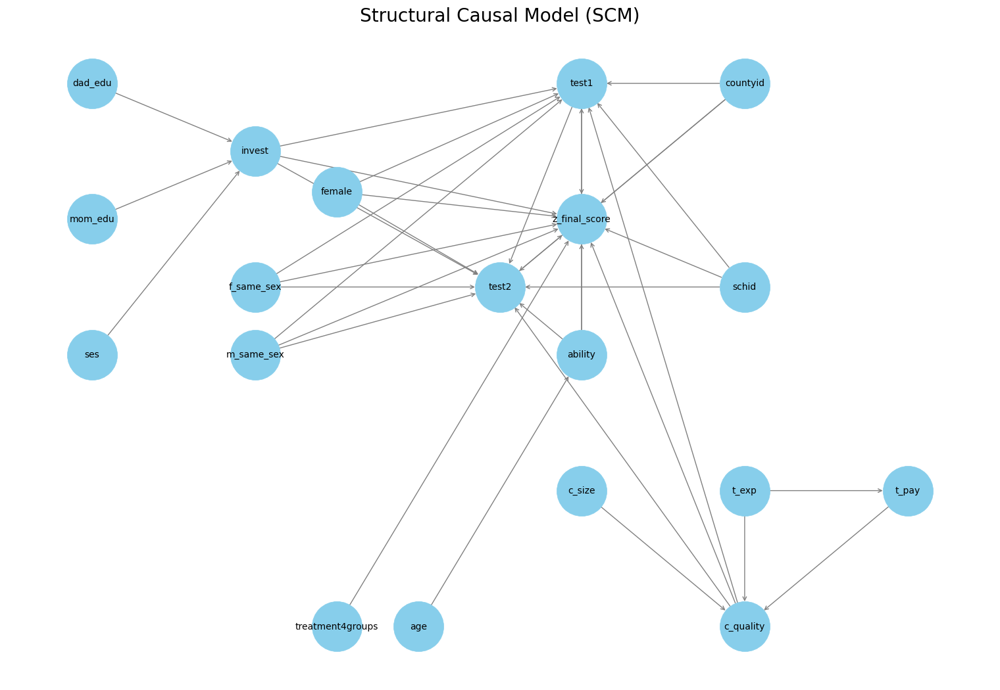

In [13]:
graph = nx.parse_gml(gml_fss)

# Plot the graph with fixed layout for clusters and spring layout for the rest
plt.figure(figsize=(15, 10))
# Define positions for clusters with updated layout
pos = {
    # Family characteristics
    'dad_edu': [-1, 1],
    'mom_edu': [-1, 0.5],
    'ses': [-1, 0],
    'invest': [-0.5, 0.75],

    # Test scores and final score
    'test1': [0.5, 1],
    'test2': [0.25, 0.25],
    'z_final_score': [0.5, 0.5],

    # Class characteristics
    'c_size': [0.5, -0.5],
    't_exp': [1, -0.5],
    't_pay': [1.5, -0.5],
    'c_quality': [1, -1],

    # Gender-related variables + levels
    'female': [-0.25, 0.6],
    'f_same_sex': [-0.5, 0.25],
    'treatment4groups': [-0.25, -1],  # Moved to gender group
    'm_same_sex': [-0.5, 0],


    # Ability and Age
    'age': [0, -1],
    'ability': [0.5, 0],
    
    # dummies 
    
     'schid': [1, 0.25],
    'countyid': [1, 1]
}
nx.draw(
    G=graph,
    pos= pos,
    with_labels=True,
    node_size=3000,
    node_color='skyblue',
    font_color='black',
    font_size=10,
    edge_color='gray',
    arrows=True,
    arrowstyle='->',
    arrowsize=10
)

plt.title("Structural Causal Model (SCM)")
plt.show()

In [14]:
score_sub_dfss = score[base_covs + other_covs + FE+ category +
                      ['treatment4groups'] + [VoI[0]]+ [VoI[1]] + response]
score_sub_dfss = score_sub_dfss.dropna()

score_sub_dfss_encoded = pd.get_dummies(score_sub_dfss, columns=['countyid'], drop_first=True)

In [15]:
def get_estimand(df, treatment='f_same_sex', outcome='z_final_score', 
                  effect_modifiers=['treatment4groups'], graph=gml_fss):
    model = CausalModel(data=df,
                        treatment=treatment,
                        outcome=outcome,
                        effect_modifiers=effect_modifiers,
                        graph=gml_fss)
    estimand = model.identify_effect()
    return estimand

In [16]:
estimand_f =get_estimand(score_sub_dfss_encoded)


/opt/conda/lib/python3.11/site-packages/dowhy/causal_model.py:583: UserWarning: 12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
  warnings.warn(


In [17]:
estimand_m =get_estimand(score_sub_dfss_encoded, treatment='m_same_sex')

In [18]:
estimand_female =get_estimand(score_sub_dfss_encoded, treatment='female')

In [19]:
print(estimand_f, estimand_m, estimand_female)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                        
────────────(E[z_final_score])
d[fₛₐₘₑ ₛₑₓ]                  
Estimand assumption 1, Unconfoundedness: If U→{f_same_sex} and U→z_final_score then P(z_final_score|f_same_sex,,U) = P(z_final_score|f_same_sex,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!
 Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                        
────────────(E[z_final_score])
d[mₛₐₘₑ ₛₑₓ]                  
Estimand assumption 1, Unconfoundedness: If U→{m_same_sex} and U→z_final_score then P(z_final_score|m_same_sex,,U) = P(z_final_score|m_same_sex,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!
 Estimand type: EstimandType.NONPARAM

In [20]:
def get_estimate_ipw(estimand, df,treatment='f_same_sex'):
    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss)
    estimate = model.estimate_effect(identified_estimand=estimand,
                                     method_name='backdoor.propensity_score_weighting',
                                     target_units='ate',
                                     effect_modifiers=['treatment4groups'])
    
    return estimate

In [21]:
def get_estimate(estimand, df,treatment='f_same_sex'):
    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss)
    estimate = model.estimate_effect(identified_estimand=estimand,
                                     method_name="backdoor.linear_regression",
                                     effect_modifiers=['treatment4groups'])
    
    return estimate

In [22]:
estimate_f = get_estimate(estimand_f, score_sub_dfss_encoded)
estimate_m = get_estimate(estimand_m, score_sub_dfss_encoded, treatment='m_same_sex')
estimate_female = get_estimate(estimand_female, score_sub_dfss_encoded, treatment='female')


/opt/conda/lib/python3.11/site-packages/dowhy/causal_estimator.py:266: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  by_effect_mods = data.groupby(effect_modifier_names)
/opt/conda/lib/python3.11/site-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/opt/conda/lib/python3.11/site-packages/dowhy/causal_estimators/regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behav

In [23]:
print(estimate_f, estimate_m,estimate_female)

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                        
────────────(E[z_final_score])
d[fₛₐₘₑ ₛₑₓ]                  
Estimand assumption 1, Unconfoundedness: If U→{f_same_sex} and U→z_final_score then P(z_final_score|f_same_sex,,U) = P(z_final_score|f_same_sex,)

## Realized estimand
b: z_final_score~f_same_sex+f_same_sex*treatment4groups
Target units: 

## Estimate
Mean value: 0.12020767620143027
### Conditional Estimates
__categorical__treatment4groups
(0.999, 2.0]    0.076042
(2.0, 3.0]      0.141918
(3.0, 4.0]      0.185321
dtype: float64 *** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                        
────────────(E[z_final_score])
d[mₛₐₘₑ ₛₑₓ]                  
Estimand assumption 1, Unconfoundedness: If U→{m_same_sex} and U→z_f

In [ ]:
!pip install econml


In [ ]:
estimate = model.estimate_effect(
identified_estimand=estimand,
method_name=’backdoor.econml.dr.LinearDRLearner’,
target_units=’ate’,
method_params={
’init_params’: {
# Specify treatment and outcome models
’model_propensity’: LogisticRegression(),
’model_regression’:
LGBMRegressor(n_estimators=1000, max_depth=10)
,
’fit_params’: {}
)


In [43]:
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMRegressor

def get_estimate_DR(estimand, df, treatment='f_same_sex'):

    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss
    )

    estimate = model.estimate_effect(
        identified_estimand=estimand,
        method_name='backdoor.econml.dr.LinearDRLearner',
        target_units='ate',
        method_params={
            'init_params': {
                'model_propensity': LogisticRegression(),
                'model_regression': LGBMRegressor(n_estimators=1000, max_depth=10),
            },
            'fit_params': {}
        }
    )

    return estimate

In [44]:
estimate_f_DR = get_estimate_DR(estimand_f, score_sub_dfss_encoded)
estimate_m_DR = get_estimate_DR(estimand_m, score_sub_dfss_encoded, treatment='m_same_sex')
estimate_female_DR = get_estimate_DR(estimand_female, score_sub_dfss_encoded, treatment='female')

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 479
[LightGBM] [Info] Number of data points in the train set: 3686, number of used features: 6
[LightGBM] [Info] Start training from score 0.069369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 480
[LightGBM] [Info] Number of data points in the train set: 3686, number of used features: 6
[LightGBM] [Info] Start training from score 0.055048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 479
[LightGBM] [Info] Number of data points in the train set: 3686, number of used features: 6
[LightGBM] [Info] Start training from score 0.079950
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [45]:
print(estimate_f_DR, estimate_m_DR, estimate_female_DR)

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                        
────────────(E[z_final_score])
d[fₛₐₘₑ ₛₑₓ]                  
Estimand assumption 1, Unconfoundedness: If U→{f_same_sex} and U→z_final_score then P(z_final_score|f_same_sex,,U) = P(z_final_score|f_same_sex,)

## Realized estimand
b: z_final_score~f_same_sex | ses,female,treatment4groups,schid,m_same_sex
Target units: ate

## Estimate
Mean value: 0.12550301340698916
Effect estimates: [[0.2240758 ]
 [0.13651399]
 [0.22962825]
 ...
 [0.00836503]
 [0.01838891]
 [0.12261709]]
 *** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
     d                        
────────────(E[z_final_score])
d[mₛₐₘₑ ₛₑₓ]                  
Estimand assumption 1, Unconfoundedness: If U→{m_same_sex} and U→z_final_score then P

# Meta Learners

# S-learner

In [74]:
!pip install lightgbm 

from copy import deepcopy

import numpy as np
import pandas as pd
from scipy import stats

from sklearn.metrics import mean_absolute_percentage_error

import dowhy

from sklearn.linear_model import LinearRegression, LogisticRegression, LassoCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

from lightgbm import LGBMRegressor

import networkx as nx

from tqdm import tqdm

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import graphviz

In [75]:
!pip install econml

In [76]:
def get_mean_estimate_s(estimand, df = score_sub_dfss_encoded, treatment = 'f_same_sex'):
    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss)
    estimate = model.estimate_effect(identified_estimand=estimand,
                                     method_name='backdoor.econml.metalearners.SLearner',
                                     target_units='ate',
                                     method_params={ 'init_params': 
                                                    {'overall_model': LGBMRegressor(n_estimators=500, max_depth=10)
                                                    },
                                                    'fit_params': {}},
                                    effect_modifiers = ['treatment4groups'])
    mean_estimate = estimate.cate_estimates.mean()    
    return mean_estimate

In [77]:
from sklearn.model_selection import GridSearchCV

def tune_and_get_mean_estimate_s(estimand, df=score_sub_dfss_encoded, treatment='f_same_sex'):
    # Extract features and target for tuning
    X = df.drop(columns=['z_final_score'])
    Y = df['z_final_score']

    # Define parameter grid for fine-tuning
    param_grid = {
        'n_estimators': [25,50,100, 200, 500],
        'max_depth': [2,3,5, 10, 15]
    }

    # Perform GridSearchCV for the best hyperparameters
    grid_search = GridSearchCV(
        estimator=LGBMRegressor(),
        param_grid=param_grid,
        cv=5,  # Number of folds for cross-validation
        scoring='neg_mean_squared_error',  # Metric for evaluation
        verbose=1  # Show progress
    )

    # Fit the grid search to find the best parameters
    grid_search.fit(X, Y)

    # Extract the best parameters
    best_params = grid_search.best_params_
    print(f"Best Parameters: {best_params}")

    # Use the best parameters in the causal model
    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss
    )
    estimate = model.estimate_effect(
        identified_estimand=estimand,
        method_name='backdoor.econml.metalearners.SLearner',
        target_units='ate',
        method_params={
            'init_params': {
                'overall_model': LGBMRegressor(
                    n_estimators=best_params['n_estimators'],
                    max_depth=best_params['max_depth']
                )
            },
            'fit_params': {}
        },
        effect_modifiers=['treatment4groups']
    )

    # Compute the mean of the CATE estimates
    mean_estimate = estimate.cate_estimates.mean()
    
    #return the tuned model and mean CATE
    return model, mean_estimate


In [82]:
tuned_model_f, tuned_estimate_f = tune_and_get_mean_estimate_s(estimand_f)
tuned_model_m, tuned_estimate_m = tune_and_get_mean_estimate_s(estimand_m, treatment = 'm_same_sex')
tuned_model_female, tuned_estimate_female = tune_and_get_mean_estimate_s(estimand_female, treatment = 'female')




Fitting 5 folds for each of 25 candidates, totalling 125 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 773
[LightGBM] [Info] Number of data points in the train set: 5898, number of used features: 27
[LightGBM] [Info] Start training from score -0.001902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 787
[LightGBM] [Info] Number of data points in the train set: 5899, number of used features: 28
[LightGBM] [Info] Start training from score 0.142290
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [83]:
print(tuned_model_f, tuned_estimate_f)

<dowhy.causal_model.CausalModel object at 0x7f85b91c7190> 0.12325777273341851


In [84]:
print(tuned_model_m,tuned_estimate_m)

<dowhy.causal_model.CausalModel object at 0x7f85c01053d0> -0.042128277209335534


In [85]:
print(tuned_model_female,tuned_estimate_female)

<dowhy.causal_model.CausalModel object at 0x7f85ca734d10> -0.158192474768914


# S-leaner on Trainning data

In [60]:
train, test = train_test_split(score_sub_dfss_encoded, test_size=0.2, random_state=123)


In [61]:
estimand_f_train =get_estimand(train)
estimand_m_train =get_estimand(train, treatment='m_same_sex')


12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


In [62]:
tuned_model_f, tuned_estimate_f_train = tune_and_get_mean_estimate_s(estimand_f_train, df=train)


Fitting 5 folds for each of 25 candidates, totalling 125 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 849
[LightGBM] [Info] Number of data points in the train set: 4718, number of used features: 29
[LightGBM] [Info] Start training from score 0.074405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [63]:
print(tuned_model_f, tuned_estimate_f_train)

<dowhy.causal_model.CausalModel object at 0x7f85b917bed0> 0.1255395776086959


In [64]:
tuned_model_m, tuned_estimate_m_train = tune_and_get_mean_estimate_s(estimand_m_train, df=train, treatment='m_same_sex')


Fitting 5 folds for each of 25 candidates, totalling 125 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 849
[LightGBM] [Info] Number of data points in the train set: 4718, number of used features: 29
[LightGBM] [Info] Start training from score 0.074405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [65]:
print(tuned_model_m, tuned_estimate_m_train)

<dowhy.causal_model.CausalModel object at 0x7f85b8deec90> -0.039864691576259575


In [66]:
print(tuned_model_m)

In [67]:
response

['z_final_score']

# T-learner

In [86]:

def get_mean_estimate_T(estimand, df = score_sub_dfss_encoded, treatment = 'f_same_sex'):
    model = CausalModel(
        data=df,
        treatment= treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss)
    estimate = model.estimate_effect(identified_estimand=estimand,
                                     method_name='backdoor.econml.metalearners.TLearner',
                                     target_units='ate',
                                     method_params={ 'init_params':
                                                    {'models': [
                                                        LGBMRegressor(n_estimators=200, max_depth=10),
                                                        LGBMRegressor(n_estimators=200, max_depth=10)]
                                                    },
                                                    'fit_params': {}},
                                     effect_modifiers = ['treatment4groups'])

    
    
    return estimate.cate_estimates.mean()

In [87]:
def tune_and_get_mean_estimate_t(estimand, df=score_sub_dfss_encoded, treatment='f_same_sex'):
    # Define parameter grid
    param_grid = {
        'n_estimators': [100, 200, 500],
        'max_depth': [5, 10, 15]
    }

    # Grid search for each model in T-Learner
    X = df.drop(columns=['z_final_score'])
    Y = df['z_final_score']

    # First model tuning
    grid_search1 = GridSearchCV(LGBMRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search1.fit(X, Y)
    best_params1 = grid_search1.best_params_
    print(f"Best Parameters 1: {best_params1}")

    # Second model tuning
    grid_search2 = GridSearchCV(LGBMRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search2.fit(X, Y)
    best_params2 = grid_search2.best_params_
    print(f"Best Parameters 2: {best_params2}")

    # Use the best params for both models in the T-Learner
    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss
    )
    estimate = model.estimate_effect(
        identified_estimand=estimand,
        method_name='backdoor.econml.metalearners.TLearner',
        target_units='ate',
        method_params={
            'init_params': {
                'models': [
                    LGBMRegressor(n_estimators=best_params1['n_estimators'], max_depth=best_params1['max_depth']),
                    LGBMRegressor(n_estimators=best_params2['n_estimators'], max_depth=best_params2['max_depth'])
                ]
            },
            'fit_params': {}
        },
        effect_modifiers=['treatment4groups']
    )
    mean_estimate = estimate.cate_estimates.mean()
    return mean_estimate


In [88]:
estimate_f_T = tune_and_get_mean_estimate_t(estimand_f)
estimate_m_T = tune_and_get_mean_estimate_t(estimand_m, treatment = 'm_same_sex')
estimate_female_T = tune_and_get_mean_estimate_t(estimand_female, treatment = 'female')


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 773
[LightGBM] [Info] Number of data points in the train set: 5898, number of used features: 27
[LightGBM] [Info] Start training from score -0.001902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [90]:
print(estimate_f_T, estimate_m_T,estimate_female_T, estimate_female_T)

0.12355929282551457 -0.04346997566290722 -0.15870375534892409 -0.15870375534892409


# X-leaerner

In [91]:
def get_mean_estimate_X(estimand, df = score_sub_dfss_encoded, treatment = 'f_same_sex'):
    model = CausalModel(
        data=df,
        treatment= treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss)
    estimate = model.estimate_effect(identified_estimand=estimand,
                                     method_name='backdoor.econml.metalearners.XLearner',
                                     target_units='ate',
                                     method_params={ 'init_params': 
                                                    {            'models': [
                                                        LGBMRegressor(n_estimators=50, max_depth=10),
                                                        LGBMRegressor(n_estimators=50, max_depth=10)],
                                                     'cate_models': [
                                                         LGBMRegressor(n_estimators=50, max_depth=10),
                                                         LGBMRegressor(n_estimators=50, max_depth=10)]},
                                                        'fit_params': {}},
                                     effect_modifiers = ['treatment4groups'])
                
    
    return estimate.cate_estimates.mean()


In [92]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMRegressor

def tune_and_get_mean_estimate_X(estimand, df=score_sub_dfss_encoded, treatment='f_same_sex'):
    # Define parameter grid
    param_grid = {
        'n_estimators': [100, 200, 500],
        'max_depth': [5, 10, 15]
    }

    # Define X (features) and Y (target)
    X = df.drop(columns=['z_final_score'])  # Exclude the target variable
    Y = df['z_final_score']                # Target variable

    # Grid search for the treatment and control models
    grid_search1 = GridSearchCV(LGBMRegressor(), param_grid, cv=3, scoring='neg_mean_squared_error')
    grid_search1.fit(X, Y)
    best_params1 = grid_search1.best_params_

    grid_search2 = GridSearchCV(LGBMRegressor(), param_grid, cv=3, scoring='neg_mean_squared_error')
    grid_search2.fit(X, Y)
    best_params2 = grid_search2.best_params_

    # Grid search for the CATE models
    grid_search3 = GridSearchCV(LGBMRegressor(), param_grid, cv=3, scoring='neg_mean_squared_error')
    grid_search3.fit(X, Y)
    best_params3 = grid_search3.best_params_

    grid_search4 = GridSearchCV(LGBMRegressor(), param_grid, cv=3, scoring='neg_mean_squared_error')
    grid_search4.fit(X, Y)
    best_params4 = grid_search4.best_params_

    # Use the best parameters for both models and CATE models in the X-Learner
    model = CausalModel(
        data=df,
        treatment=treatment,
        outcome='z_final_score',
        effect_modifiers=['treatment4groups'],
        graph=gml_fss
    )
    estimate = model.estimate_effect(
        identified_estimand=estimand,
        method_name='backdoor.econml.metalearners.XLearner',
        target_units='ate',
        method_params={
            'init_params': {
                'models': [
                    LGBMRegressor(n_estimators=best_params1['n_estimators'], max_depth=best_params1['max_depth']),
                    LGBMRegressor(n_estimators=best_params2['n_estimators'], max_depth=best_params2['max_depth'])
                ],
                'cate_models': [
                    LGBMRegressor(n_estimators=best_params3['n_estimators'], max_depth=best_params3['max_depth']),
                    LGBMRegressor(n_estimators=best_params4['n_estimators'], max_depth=best_params4['max_depth'])
                ]
            },
            'fit_params': {}
        },
        effect_modifiers=['treatment4groups']
    )
    
    mean_estimate = estimate.cate_estimates.mean()
    return mean_estimate


In [93]:
estimate_f_X = tune_and_get_mean_estimate_X(estimand_f)
estimate_m_X = tune_and_get_mean_estimate_X(estimand_m, treatment = 'm_same_sex')
estimate_female_X = tune_and_get_mean_estimate_X(estimand_female, treatment = 'female')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700
[LightGBM] [Info] Number of data points in the train set: 4915, number of used features: 24
[LightGBM] [Info] Start training from score -0.075603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700
[LightGBM] [Info] Number of data points in the train set: 4915, number of used features: 24
[LightGBM] [Info] Start training from score -0.07

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 727
[LightGBM] [Info] Number of data points in the train set: 4915, number of used features: 25
[LightGBM] [Info] Start training from score 0.097568
[LightGBM] [Warning] No further splits with positive gain, best gain: -

12 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [95]:
print(estimate_f_X, estimate_m_X, estimate_female_X)

0.12355935565915621 -0.043469997614021545 -0.15870374617523805


# DML econml

In [13]:
!pip install econml

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler

  Using cached econml-0.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (38 kB)
  Using cached sparse-0.15.4-py2.py3-none-any.whl.metadata (4.5 kB)
  Using cached shap-0.43.0-cp311-cp311-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (24 kB)
  Using cached lightgbm-4.5.0-py3-none-manylinux_2_28_x86_64.whl.metadata (17 kB)
  Using cached slicer-0.0.7-py3-none-any.whl.metadata (3.7 kB)
Using cached econml-0.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (4.7 MB)
Using cached shap-0.43.0-cp311-cp311-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (532 kB)
Using cached slicer-0.0.7-py3-none-any.whl (14 kB)
Using cached lightgbm-4.5.0-py3-none-manylinux_2_28_x86_64.whl (3.6 MB)
Using cached sparse-0.15.4-py2.py3-none-any.whl (237 kB)


In [14]:

## Ignore warnings
import warnings
warnings.filterwarnings("ignore")
# Main imports
from econml.dml import DML, LinearDML, SparseLinearDML, CausalForestDML

# Helper imports
import numpy as np
from itertools import product
from sklearn.linear_model import (Lasso, MultiTaskElasticNetCV)
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

%matplotlib inline

In [18]:
train, test = train_test_split(score_sub1, test_size=0.2, random_state=123)


In [19]:
train.shape

(5898, 18)

In [20]:
train.shape

(5898, 18)

In [21]:
Y_train = train['z_final_score'].values
T = VoI + ['female']
T1 = 'f_same_sex'
T2 = 'm_same_sex'
T3 = 'female'
T_train = train[T].values
T1_train = train[T1].values
T2_train = train[T2].values
T3_train = train[T3].values
T_test = test[T].values
T1_test = test[T1].values
T2_test = test[T2].values
T3_test = test[T3].values


scaler = StandardScaler()
W1_train = pd.get_dummies(train[['countyid', 'schid']]).values
W2_train = train[['gains', 'p4p', 'levels']].values
W3_train = train[ ['zmathbase1', 'zmathbase2']].values
W4_train = scaler.fit_transform(train[['stuage', 'dad_jhs_yn',
                                       'mom_jhs_yn', 'ses', 'class_size',
                                       'teacher_experience']].values)
W_train = np.concatenate([W1_train, W2_train, W3_train, W4_train], axis=1) 
X_train=scaler.fit_transform(train[['teacher_basepay']].values)


In [22]:
T

['f_same_sex', 'm_same_sex', 'female']

In [23]:
X_test=scaler.fit_transform(test[['teacher_basepay']].values)


In [19]:
def plot_treatment_effects(X_test, te_preds, labels=None, title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect"):

    # Flatten X_test if necessary
    X_test_flat = X_test.flatten() if X_test.ndim == 2 else X_test

    # Sort X_test once for consistency
    sorted_indices = np.argsort(X_test_flat)
    X_test_sorted = X_test_flat[sorted_indices]

    # Create the plot
    plt.figure(figsize=(10, 6))
    for i, te_pred in enumerate(te_preds):
        # Sort the treatment effect predictions to match sorted X_test
        te_pred_sorted = te_pred[sorted_indices]
        label = labels[i] if labels is not None and i < len(labels) else f"Effect {i+1}"
        plt.plot(X_test_sorted, te_pred_sorted, label=label)

    # Customize the plot
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.show()


# linear DML

In [105]:
est =  LinearDML(model_y=RandomForestRegressor(),
                model_t=RandomForestRegressor(),
                random_state=123)
est.fit(Y_train, T1_train, X=X_train, W=W_train)
te_pred = est.effect(X_test)

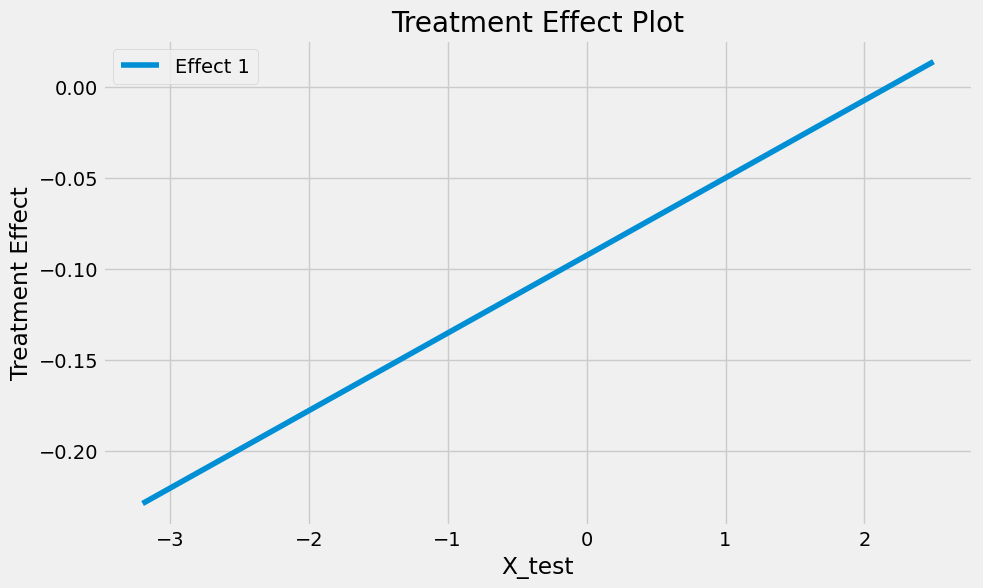

In [106]:
# 
plot_treatment_effects(X_test, [te_pred], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

#### 1.2.2. Polynomial Features for Heterogeneity

In [107]:
est1 = SparseLinearDML(model_y=RandomForestRegressor(),
                       model_t=RandomForestRegressor(),
                       featurizer=PolynomialFeatures(degree=3),
                       random_state=123)

est1.fit(Y_train, T1_train, X=X_train, W=W_train)
te_pred1 = est1.effect(X_test)
#te_pred1 = est.const_marginal_effect(X_test)

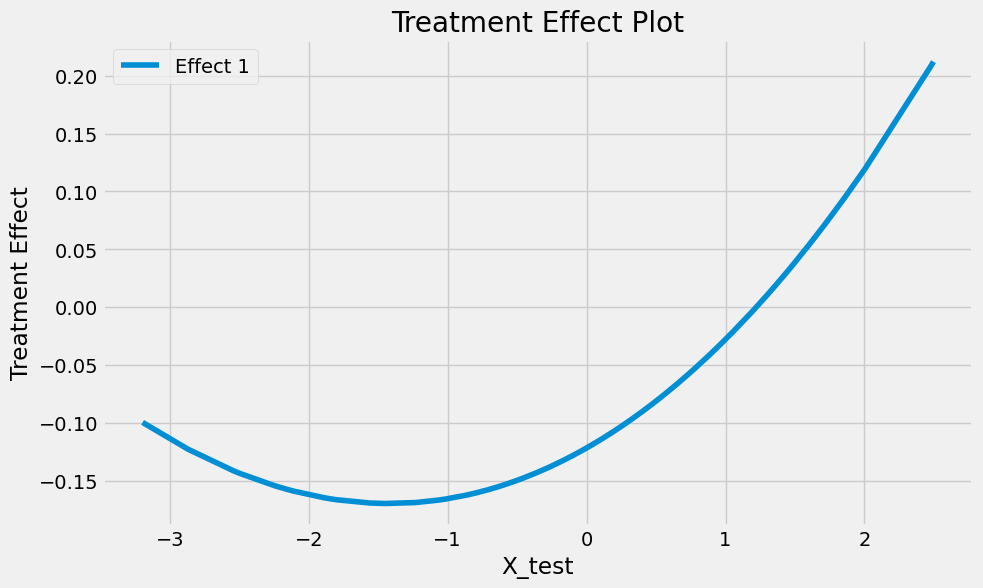

In [108]:
plot_treatment_effects(X_test, [te_pred1], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

#### 1.2.3. Polynomial Features with regularization 

In [109]:
est2 = DML(model_y=RandomForestRegressor(),
           model_t=RandomForestRegressor(),
           model_final=Lasso(alpha=0.1, fit_intercept=False),
           featurizer=PolynomialFeatures(degree=10),
           random_state=123)
est2.fit(Y_train, T1_train, X=X_train, W=W_train)
te_pred2 = est2.effect(X_test)

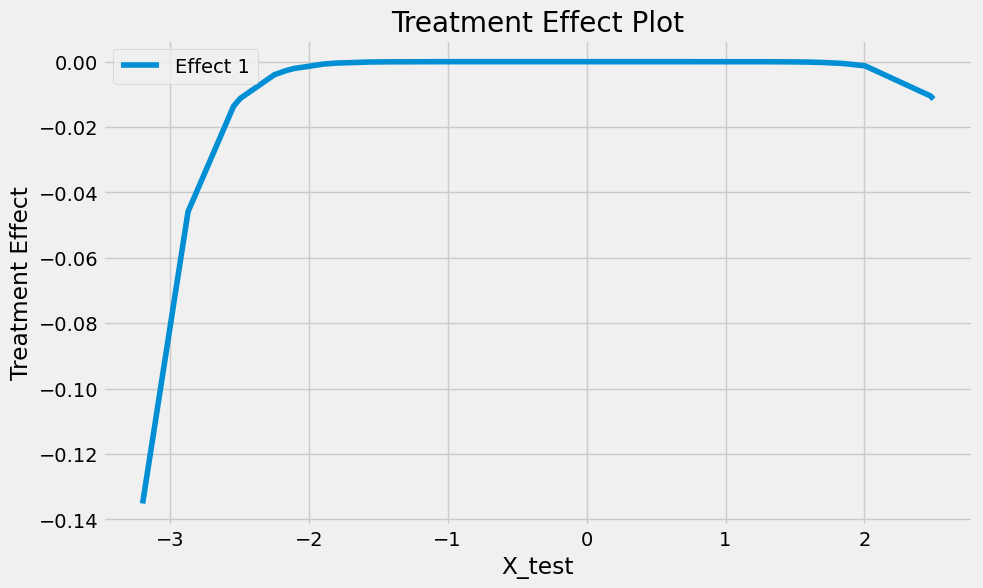

In [110]:
plot_treatment_effects(X_test, [te_pred2], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

#### 1.2.4 Non-Parametric Heterogeneity with Causal Forest

In [111]:
est3 = CausalForestDML(model_y=RandomForestRegressor(),
                       model_t=RandomForestRegressor(),
                       criterion='mse', n_estimators=1000,
                       min_impurity_decrease=0.001,
                       random_state=123)
est3.tune(Y_train, T_train, X=X_train, W=W_train)
est3.fit(Y_train, T_train, X=X_train, W=W_train)
te_pred3 = est3.effect(X_test)

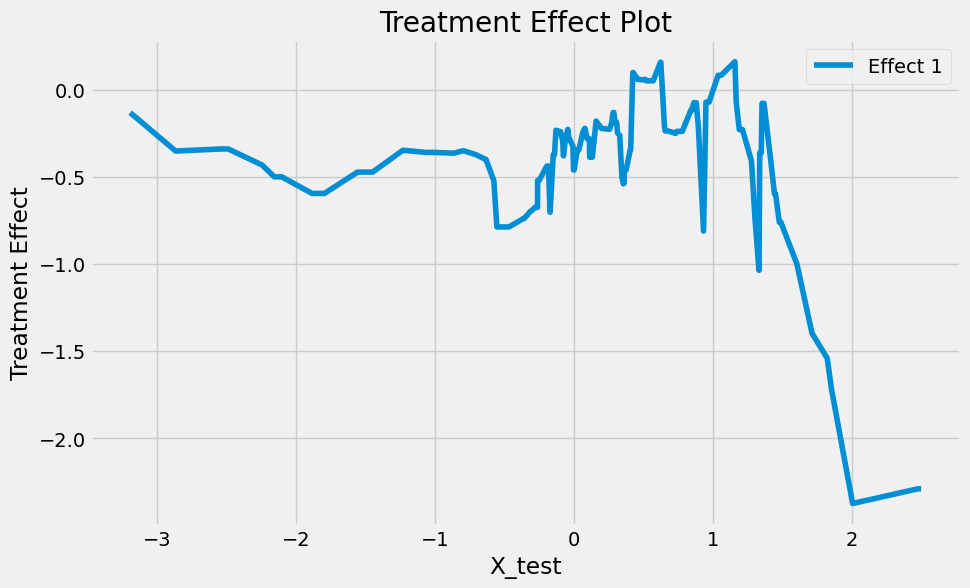

In [112]:
plot_treatment_effects(X_test, [te_pred3], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

### 1.3. Performance Visualization

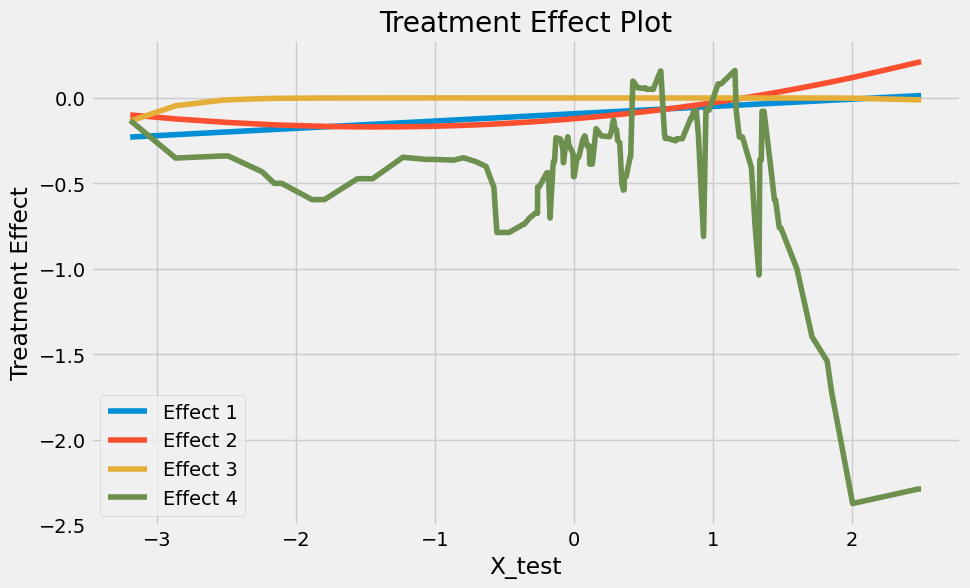

In [113]:
plot_treatment_effects(X_test, [te_pred,te_pred1,te_pred2, te_pred3], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

# DML Mutiple treatments

In [98]:
#degree 1
est = LinearDML(model_y=GradientBoostingRegressor(n_estimators=100, max_depth=3, min_samples_leaf=20),
                model_t=MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100,
                                                                       max_depth=3,
                                                                       min_samples_leaf=20)),
                featurizer=PolynomialFeatures(degree=1, include_bias=False),
                cv=5)
est.fit(Y_train, T_train, X=X_train, W=W_train)
te_pred = est.const_marginal_effect(X_test)
lb, ub = est.const_marginal_effect_interval(X_test, alpha=0.01)

In [99]:
est.score(Y_train, T_train, X=X_train, W=W_train)

0.4962531634202663

In [100]:
plot_treatment_effects(X_test, [te_pred], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

NameError: name 'plot_treatment_effects' is not defined

In [103]:
#degree 2
est = LinearDML(model_y=GradientBoostingRegressor(n_estimators=100, max_depth=3, min_samples_leaf=20),
                model_t=MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100,
                                                                       max_depth=3,
                                                                       min_samples_leaf=20)),
                featurizer=PolynomialFeatures(degree=2, include_bias=False),
                cv=5)
est.fit(Y_train, T_train, X=X_train, W=W_train)
te_pred = est.const_marginal_effect(X_test)
lb, ub = est.const_marginal_effect_interval(X_test, alpha=0.01)

In [ ]:
est.score(Y_train, T_train, X=X_train, W=W_train)

In [ ]:
def plot_treatment_effects(X_test, te_preds, labels=None, 
                           title="Treatment Effect Plot", 
                           xlabel="X_test", ylabel="Treatment Effect"):
    import numpy as np
    import matplotlib.pyplot as plt

    # Flatten X_test if necessary
    X_test_flat = X_test.flatten() if X_test.ndim == 2 else X_test

    # Sort X_test once for consistency
    sorted_indices = np.argsort(X_test_flat)
    X_test_sorted = X_test_flat[sorted_indices]

    # Create the plot
    plt.figure(figsize=(10, 6))
    for i, te_pred in enumerate(te_preds):
        # Sort the treatment effect predictions to match sorted X_test
        te_pred_sorted = te_pred[sorted_indices]
        label = labels[i] if labels is not None and i < len(labels) else f"Effect {i+1}"
        plt.plot(X_test_sorted, te_pred_sorted, label=label)

    # Customize the plot
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(["Female student female teacher", "Male student male teacher", "female"], title="Legend", loc="best")
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()


In [ ]:
plot_treatment_effects(X_test, [te_pred], labels=None, 
                       title="Treatment Effect Plot", xlabel="Teacher’s base monthly salary", ylabel="Treatment Effect")



In [ ]:
#degree 3
est = LinearDML(model_y=GradientBoostingRegressor(n_estimators=100, max_depth=3, min_samples_leaf=20),
                model_t=MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100,
                                                                       max_depth=3,
                                                                       min_samples_leaf=20)),
                featurizer=PolynomialFeatures(degree=3, include_bias=False),
                cv=5)
est.fit(Y_train, T_train, X=X_train, W=W_train)
te_pred = est.const_marginal_effect(X_test)
lb, ub = est.const_marginal_effect_interval(X_test, alpha=0.01)

In [ ]:
est.score(Y_train, T_train, X=X_train, W=W_train)

In [ ]:
# Average Treatment Effect (ATE)
ate = est.ate(X=X_train)
print("Average Treatment Effect (ATE):", ate)


In [ ]:
# Estimate individualized treatment effects
ite = est.effect(X_train)
print("Individualized Treatment Effects (ITE):", ite)


In [ ]:
# Compare treatment effects between T1 and T2
effect_diff = est.effect(X_train, T0=T3_train, T1=T1_train)
print("Effect of Switching from T1 to T2:", effect_diff)


In [ ]:
plot_treatment_effects(X_test, [te_pred], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

In [ ]:
#degree 5
est = LinearDML(model_y=GradientBoostingRegressor(n_estimators=100, max_depth=3, min_samples_leaf=20),
                model_t=MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100,
                                                                       max_depth=3,
                                                                       min_samples_leaf=20)),
                featurizer=PolynomialFeatures(degree=5, include_bias=False),
                cv=5)
est.fit(Y_train, T_train, X=X_train, W=W_train)
te_pred = est.const_marginal_effect(X_test)
lb, ub = est.const_marginal_effect_interval(X_test, alpha=0.01)

In [ ]:
est.score(Y_train, T_train, X=X_train, W=W_train)

In [ ]:
plot_treatment_effects(X_test, [te_pred], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

In [ ]:
#degree 10
est = LinearDML(model_y=GradientBoostingRegressor(n_estimators=100, max_depth=3, min_samples_leaf=20),
                model_t=MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100,
                                                                       max_depth=3,
                                                                       min_samples_leaf=20)),
                featurizer=PolynomialFeatures(degree=10, include_bias=False),
                cv=5)
est.fit(Y_train, T_train, X=X_train, W=W_train)
te_pred = est.const_marginal_effect(X_test)
lb, ub = est.const_marginal_effect_interval(X_test, alpha=0.01)

In [ ]:
est.score(Y_train, T_train, X=X_train, W=W_train)

In [ ]:
plot_treatment_effects(X_test, [te_pred], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

# causal forest dml

In [104]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
est2 = CausalForestDML(model_y=GradientBoostingRegressor(n_estimators=100, max_depth=3, min_samples_leaf=20),
                       model_t=MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100,
                                                                              max_depth=3,
                                                                              min_samples_leaf=20)),
                       cv=5,
                       criterion='mse', n_estimators=1000,
                       min_samples_leaf=10,
                       min_impurity_decrease=0.001,
                       random_state=123)
est2.tune(Y_train, T_train, X=X_train, W=W_train)
est2.fit(Y_train, T_train, X=X_train, W=W_train)

In [105]:
est2.score(Y_train, T_train, X=X_train, W=W_train)

0.4852371320044015

In [106]:
te_pred2 = est2.const_marginal_effect(X_test)
lb2, ub2 = est2.const_marginal_effect_interval(X_test, alpha=0.01)

In [107]:
plot_treatment_effects(X_test, [te_pred2], labels=None, 
                       title="Treatment Effect Plot", xlabel="X_test", ylabel="Treatment Effect")

NameError: name 'plot_treatment_effects' is not defined

In [ ]:
# ATE for LinearDML
ate_linear = est.ate(X=X_test, T0 = T3_test, T1 = T1_test)
print("LinearDML ATE:", ate_linear)

# ATE for CausalForestDML
ate_forest = est2.ate(X=X_test, T0 = T3_test, T1 = T1_test)
print("CausalForestDML ATE:", ate_forest)


In [ ]:

# Compute individual treatment effects
ite = est.effect(X=X_test, T0=T3_test, T1=T1_test)

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(ite, bins=30, edgecolor='k', alpha=0.7)
plt.title("Distribution of Individualized Treatment Effects (ITE)")
plt.xlabel("Treatment Effect")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(["Female", "Female student male teacher", "Effect Difference"], title="Legend", loc="best")

plt.show()


In [ ]:

# Compute individual treatment effects
ite2 = est2.effect(X=X_test, T0=T3_test, T1=T1_test)

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(ite2, bins=30, edgecolor='k', alpha=0.7)
plt.title("Distribution of Individualized Treatment Effects (ITE)")
plt.xlabel("Treatment Effect")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(["Female", "Female student male teacher", "Effect Difference"], title="Legend", loc="best")

plt.show()

In [108]:
import matplotlib.pyplot as plt
import numpy as np

def plot_treatment_effects_multiple_models(
    X_test, models, expected_effects=None, titles=None, xlabel="x", ylabel="Treatment Effect"
):


    # Sort X_test and prepare sorted indices
    X_test_flat = X_test[:, 0]
    sorted_indices = np.argsort(X_test_flat)
    X_test_sorted = X_test_flat[sorted_indices]

    # Sort true effects if provided
    if expected_effects:
        expected_effects_sorted = [effect[sorted_indices] for effect in expected_effects]
    else:
        expected_effects_sorted = None

    # Plot each model in a separate subplot
    n_models = len(models)
    plt.figure(figsize=(15, 6))

    for i, model in enumerate(models):
        # Extract and sort model data
        te_pred_sorted = model["te_pred"][sorted_indices]
        lb_sorted = model["lb"][sorted_indices]
        ub_sorted = model["ub"][sorted_indices]
        label = model.get("label", f"Model {i+1}")
        title = titles[i] if titles and i < len(titles) else f"Model {i+1}"

        # Create subplot for the model
        plt.subplot(1, n_models, i + 1)
        plt.title(title)

        # Plot treatment effects and confidence intervals
        plt.plot(X_test_sorted, te_pred_sorted[:, 0], label=f"{label} Female student female teacher")
        plt.fill_between(X_test_sorted, lb_sorted[:, 0], ub_sorted[:, 0], alpha=0.4, label=f"{label} CI 1")
        plt.plot(X_test_sorted, te_pred_sorted[:, 1], label=f"{label} Male student male teacher")
        plt.fill_between(X_test_sorted, lb_sorted[:, 1], ub_sorted[:, 1], alpha=0.4, label=f"{label} CI 2")
        plt.plot(X_test_sorted, te_pred_sorted[:, 2], label=f"{label} Female")
        plt.fill_between(X_test_sorted, lb_sorted[:, 2], ub_sorted[:, 1], alpha=0.4, label=f"{label} CI 3")


        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend()

    plt.tight_layout()
    plt.show()


In [109]:
model_1 = {
    "te_pred": te_pred,   # Predicted effects for model 1
    "lb": lb,             # Lower bounds for model 1
    "ub": ub,             # Upper bounds for model 1
    "label": "LinearDML"
}

model_2 = {
    "te_pred": te_pred2,  # Predicted effects for model 2
    "lb": lb2,            # Lower bounds for model 2
    "ub": ub2,            # Upper bounds for model 2
    "label": "CausalForestDML"
}

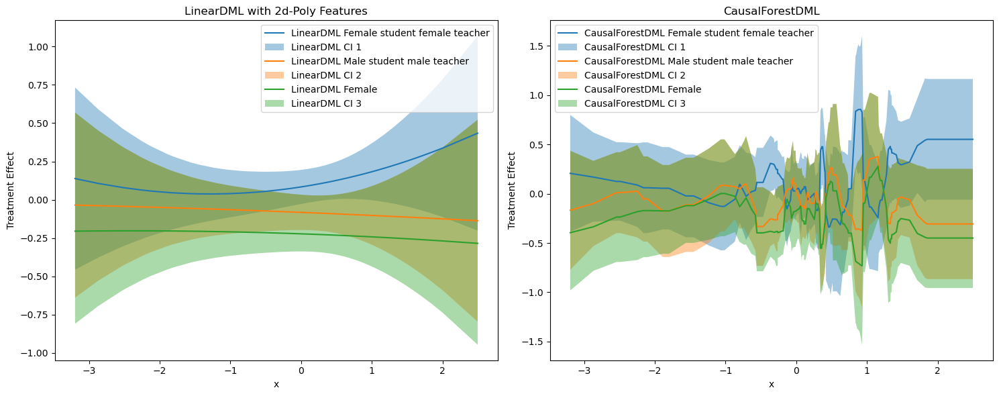

In [110]:
plot_treatment_effects_multiple_models(
    X_test=X_test,
    models=[model_1, model_2],
    titles=["LinearDML with 2d-Poly Features", "CausalForestDML"]
)

In [ ]:
te_pred.shape

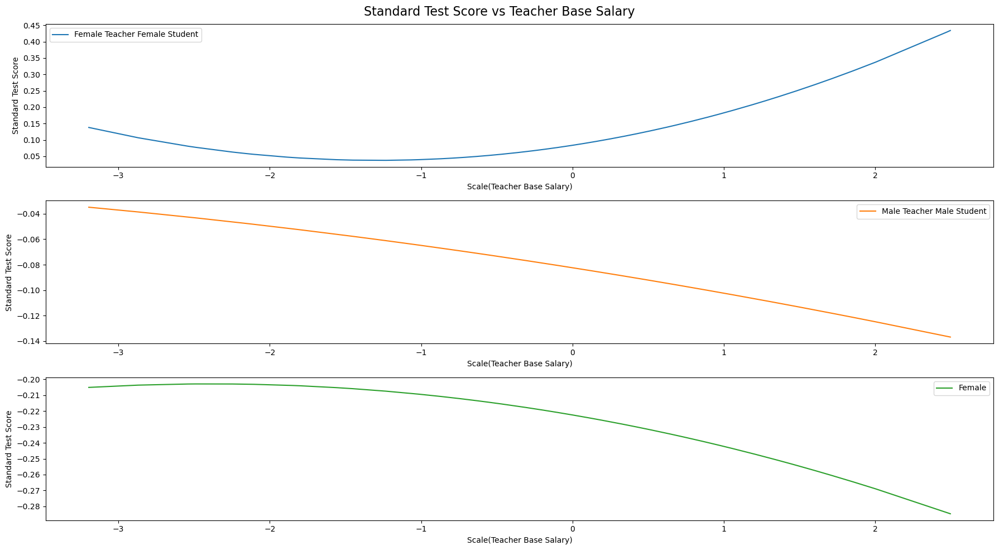

In [111]:
plt.figure(figsize=(18, 10))

# Dictionary for labels
dic = {0: "Female Teacher Female Student", 1: "Male Teacher Male Student", 2: "Female"}

# Sort X_test for smooth plotting
sorted_indices = np.argsort(X_test[:, 0])
X_test_sorted = X_test[sorted_indices, 0]  # Sorted x-values

# Loop over the 3 groups/treatments
for i in range(3):  # Loop over columns of te_pred
    plt.subplot(3, 1, i + 1)  # Create a separate subplot for each treatment/group

    # Sort treatment effects to align with sorted X_test
    te_pred_sorted = te_pred[sorted_indices, i]

    # Plot sorted values
    plt.plot(X_test_sorted, te_pred_sorted,
             color=f"C{i}",
             label=dic[i])  # Label for the group
    plt.xlabel(r'Scale(Teacher Base Salary)')
    plt.ylabel('Standard Test Score')
    plt.legend()

# Add a common title
plt.suptitle("Standard Test Score vs Teacher Base Salary", fontsize=16)
plt.tight_layout()
plt.show()



In [119]:

def plot_treatment_effects_separate(
    X_test, models, expected_effects=None, titles=None, xlabel="x", ylabel="Treatment Effect"
):
    # Define specific colors for treatments
    colors = ['blue', 'orange', 'green']  # Colors for the treatments

    # Sort X_test and prepare sorted indices
    X_test_flat = X_test[:, 0]
    sorted_indices = np.argsort(X_test_flat)
    X_test_sorted = X_test_flat[sorted_indices]

    # Sort true effects if provided
    if expected_effects:
        expected_effects_sorted = [effect[sorted_indices] for effect in expected_effects]
    else:
        expected_effects_sorted = None

    # Plot each model and each treatment in separate subplots
    n_models = len(models)
    treatments = ["Female student female teacher", "Male student male teacher", "Female"]

    plt.figure(figsize=(20, 8 * n_models))  # Adjust height based on the number of models

    for i, model in enumerate(models):
        # Extract and sort model data
        te_pred_sorted = model["te_pred"][sorted_indices]
        lb_sorted = model["lb"][sorted_indices]
        ub_sorted = model["ub"][sorted_indices]
        label = model.get("label", f"Model {i+1}")
        title = titles[i] if titles and i < len(titles) else f"Model {i+1}"

        for j, treatment in enumerate(treatments):
            # Create subplot for each treatment
            plt.subplot(n_models, 3, i * 3 + j + 1)  # Rows: models, Columns: treatments
            plt.title(f"{title} - {treatment}")

            # Plot treatment effects and confidence intervals
            plt.plot(X_test_sorted, te_pred_sorted[:, j], color=colors[j], label=f"{label} {treatment}")
            plt.fill_between(
                X_test_sorted, lb_sorted[:, j], ub_sorted[:, j], color=colors[j], alpha=0.4, label=f"{label} CI {j + 1}"
            )

            plt.xlabel(Normalized teacher monthly base salary)')
            plt.ylabel(ylabel)
            plt.legend()

    plt.tight_layout()
    plt.show()



SyntaxError: unterminated string literal (detected at line 43) (3164295750.py, line 43)

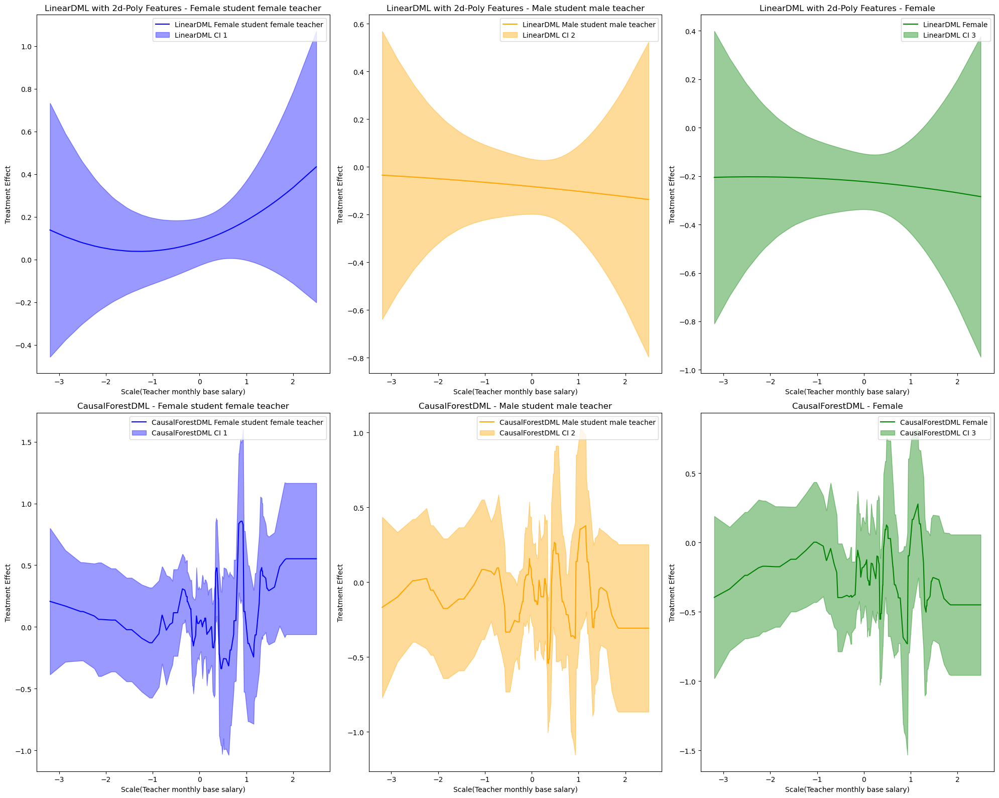

In [120]:
plot_treatment_effects_separate(
    X_test, 
    models=[
        {"te_pred": te_pred, "lb": lb, "ub": ub, "label": "LinearDML"},
        {"te_pred": te_pred2, "lb": lb2, "ub": ub2, "label": "CausalForestDML"}
    ],
    titles=["LinearDML with 2d-Poly Features", "CausalForestDML"],
    xlabel="X",
    ylabel="Treatment Effect"
)


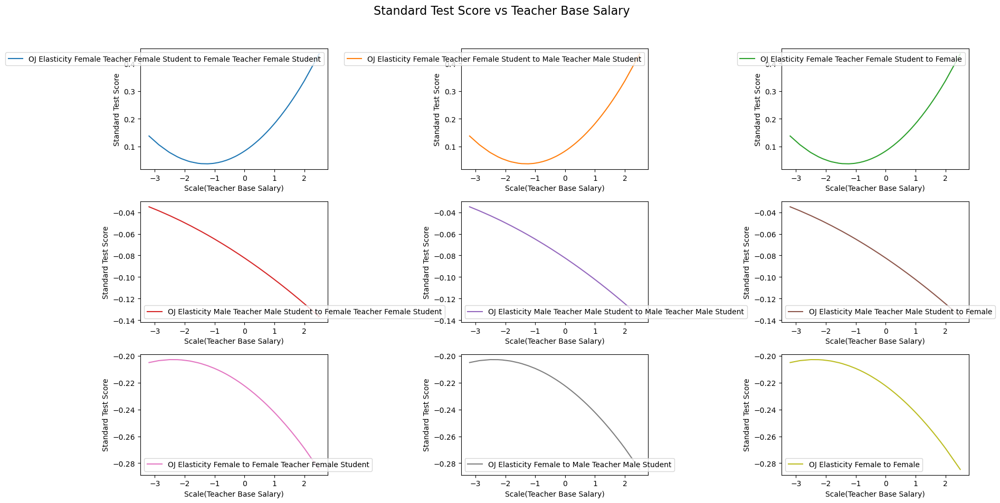

In [114]:
plt.figure(figsize=(18, 10))

# Dictionary for labels for better interpretation
dic = {0: "Female Teacher Female Student", 
              1: "Male Teacher Male Student", 2: "Female"}

# Sort X_test for smooth plotting
sorted_indices = np.argsort(X_test[:, 0])
X_test_sorted = X_test[sorted_indices, 0]  # Sorted x-values

# Loop over the 3x3 combinations
for i in range(3):  # Rows
    for j in range(3):  # Columns
        plt.subplot(3, 3, 3 * i + j + 1)  # Create a 3x3 grid of subplots

        # Sort treatment effects to align with sorted X_test
        te_pred_sorted = te_pred[sorted_indices, i]

        # Plot each subplot
        plt.plot(X_test_sorted, te_pred_sorted,
                 color=f"C{3 * i + j}",
                 label=f"OJ Elasticity {dic[i]} to {dic[j]}")

        # Labeling the plot
        plt.xlabel(r'Scale(Teacher Base Salary)')
        plt.ylabel('Standard Test Score')
        plt.legend()

# Add a common title for the entire figure
plt.suptitle("Standard Test Score vs Teacher Base Salary", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [133]:
te_pred_interval = est.const_marginal_effect_interval(X_test, alpha=0.02)

In [134]:
print(te_pred_interval[0].shape, te_pred_interval[1].shape)


(1475, 3) (1475, 3)


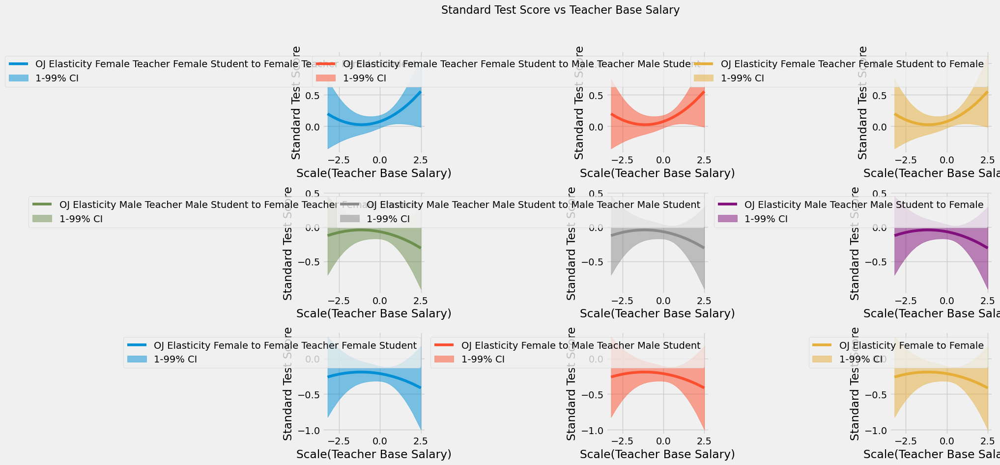

In [135]:
plt.figure(figsize=(18, 10))

# Dictionary for labels for better interpretation
dic = {0: "Female Teacher Female Student", 
       1: "Male Teacher Male Student", 
       2: "Female"}

# Sort X_test for smooth plotting
sorted_indices = np.argsort(X_test[:, 0])
X_test_sorted = X_test[sorted_indices, 0]  # Sorted x-values

# Loop over the 3x3 combinations
for i in range(3):  # Rows
    for j in range(3):  # Columns
        plt.subplot(3, 3, 3 * i + j + 1)  # Create a 3x3 grid of subplots

        # Sort treatment effects and confidence intervals
        te_pred_sorted = te_pred[sorted_indices, i]
        lb_sorted = te_pred_interval[0][sorted_indices, i]  # Lower bound
        ub_sorted = te_pred_interval[1][sorted_indices, i]  # Upper bound

        # Plot treatment effects
        plt.plot(X_test_sorted, te_pred_sorted,
                 color=f"C{3 * i + j}",
                 label=f"OJ Elasticity {dic[i]} to {dic[j]}")

        # Plot confidence intervals
        plt.fill_between(X_test_sorted, lb_sorted, ub_sorted,
                         color=f"C{3 * i + j}", alpha=0.5, label="1-99% CI")

        # Labeling the plot
        plt.xlabel(r'Scale(Teacher Base Salary)')
        plt.ylabel('Standard Test Score')
        plt.legend()

# Add a common title for the entire figure
plt.suptitle("Standard Test Score vs Teacher Base Salary", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


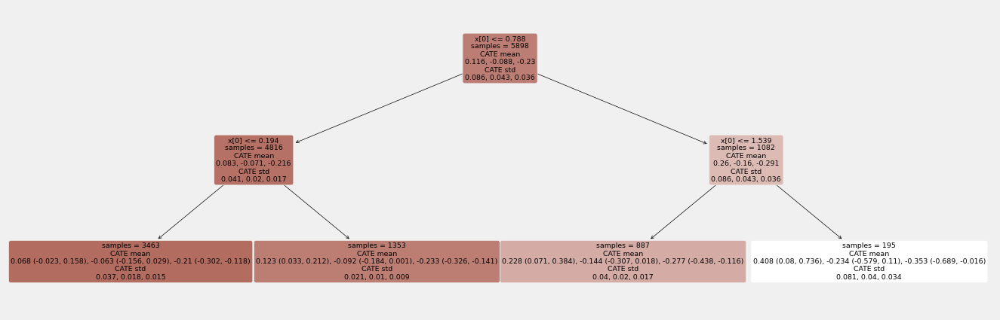

In [136]:
from econml.cate_interpreter import SingleTreeCateInterpreter

intrp = SingleTreeCateInterpreter(include_model_uncertainty=True, max_depth=2)
intrp.interpret(est, X_train)
plt.figure(figsize=(15, 5))
intrp.plot()
plt.show()

# GRF

In [15]:
from econml.grf import CausalForest, CausalIVForest, RegressionForest
import numpy as np
import scipy.special
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

In [73]:
grf = CausalForest(criterion='het', n_estimators=400, min_samples_leaf=5, max_depth=None,
                   min_var_fraction_leaf=None, min_var_leaf_on_val=True,
                   min_impurity_decrease = 0.0, max_samples=0.45, min_balancedness_tol=.45,
                   warm_start=False, inference=True, fit_intercept=True, subforest_size=4,
                   honest=True, verbose=0, n_jobs=-1, random_state=1235)

In [74]:
X_combined = np.hstack([X_train, W_train])  
X_test_combined = np.hstack([X_test, W_test])

In [75]:
grf.fit( X_combined, T_train, Y_train)


CausalForest(criterion='het', min_var_leaf_on_val=True, n_estimators=400,
             random_state=1235)

In [90]:
# Generate dummy variable names
countyid_dummies = pd.get_dummies(train['countyid']).columns.tolist()
schid_dummies = pd.get_dummies(train['schid']).columns.tolist()

# Combine all feature names
feature_names = ["Teacher's monthly base pay",'County ID', "School ID", "Gains incentives",
                 "Pay for percentile incentives", "Levels incentives",
                 'Baseline achievement scores 1', 'Baseline achievement scores 2',  
                 "Student's age",'Father\'s Education ', "Mother\'s Education ", "Social Economic Score", "Class size",
                 "Teahcer's experience"]  





In [91]:
import pandas as pd

# Access feature importances
feature_importances = grf.feature_importances_

print(feature_importances)


[0.0270361  0.00530833 0.02591681 0.00328038 0.0042307  0.00091556
 0.0158662  0.01734467 0.00239543 0.00123889 0.00142974 0.01133443
 0.04273325 0.84096951]


In [92]:
# Check lengths of feature names and importances
print("Number of Feature Names:", len(feature_names))
print("Number of Feature Importances:", len(feature_importances))


Number of Feature Names: 14
Number of Feature Importances: 14


In [93]:
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Step 3: Sort features by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

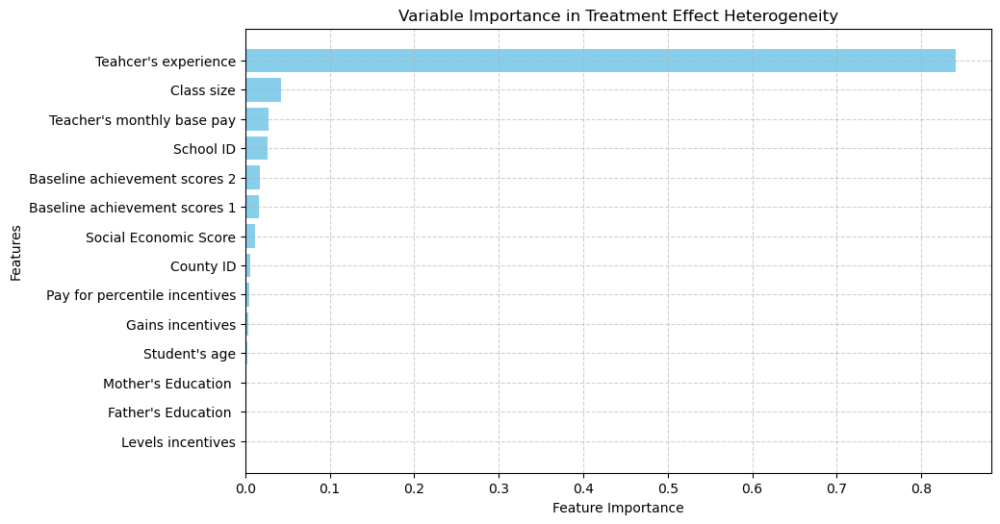

In [94]:
# Step 4: Plot the variable importance
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Variable Importance in Treatment Effect Heterogeneity")
plt.gca().invert_yaxis()  # Invert Y-axis for better readability
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

In [34]:
T


['f_same_sex', 'm_same_sex', 'female']

In [36]:
point, lb, ub = grf.predict(X_test_combined, interval=True, alpha=0.01)

In [37]:
point = grf.predict(X_test_combined)

In [38]:
point

array([[ 0.17025036, -0.08210468, -0.37486281],
       [-0.14166692,  0.24523274,  0.0157093 ],
       [ 0.25316215, -0.40516628, -0.43972265],
       ...,
       [ 0.18341888, -0.2704038 , -0.49656757],
       [ 0.85818744, -0.89064372, -0.84211475],
       [ 0.20086301, -0.0132553 , -0.2425732 ]])

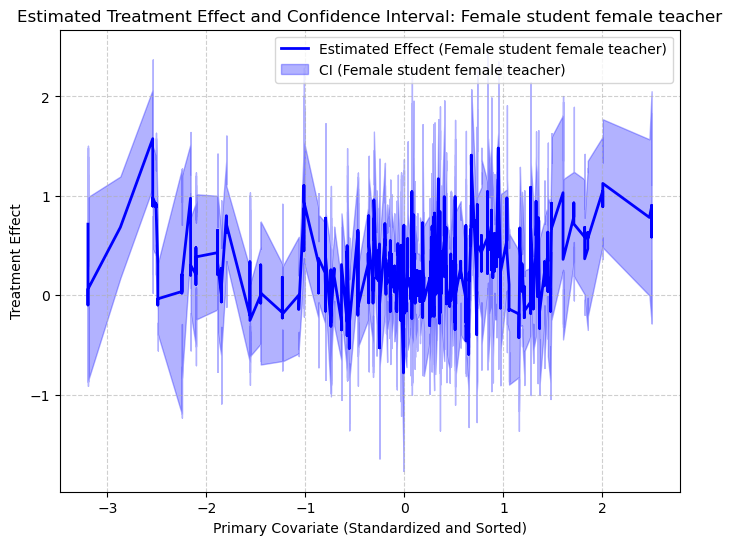

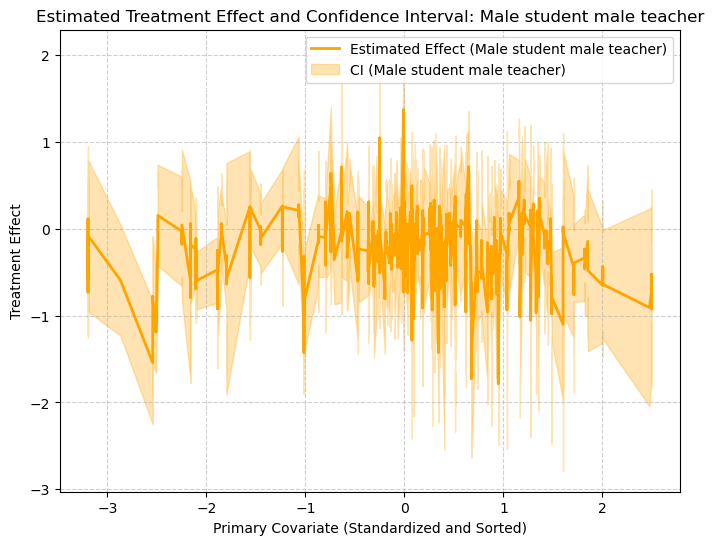

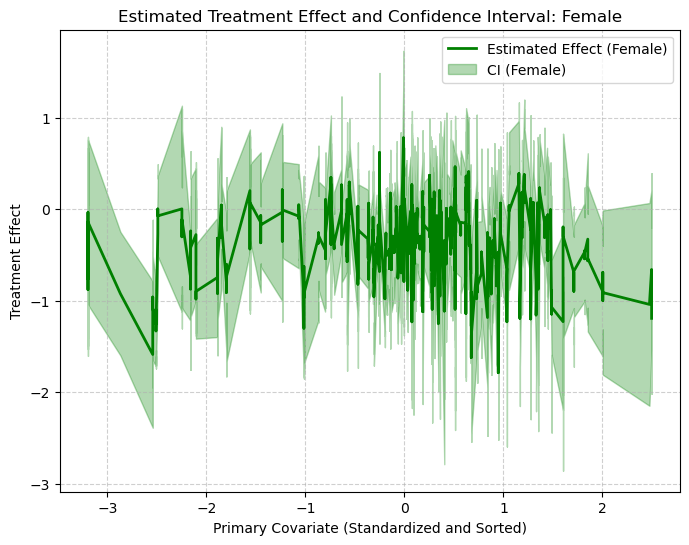

In [51]:
# Sort X_test_combined and corresponding predictions
sorted_indices = np.argsort(X_test_combined[:, 0])
X_test_combined_sorted = X_test_combined[sorted_indices, 0]  # Sorted X_test_combined[:, 0]
point_sorted = point[sorted_indices]       # Sorted treatment effect predictions
lb_sorted = lb[sorted_indices]            # Sorted lower bounds
ub_sorted = ub[sorted_indices]            # Sorted upper bounds
colors = ['blue', 'orange', 'green']  # Colors for the treatments


treatment_mapping = {
    0: "Female student female teacher",
    1: "Male student male teacher",
    2: "Female"
}


# Define a color palette
colors = ['blue', 'orange', 'green']  # Colors for the treatments

# Plot each treatment separately
for t in range(T_train.shape[1]):
    plt.figure(figsize=(8, 6))
    
    # Plot the estimated treatment effects
    plt.plot(
        X_test_combined_sorted, 
        point_sorted[:, t], 
        label=f"Estimated Effect ({treatment_mapping[t]})", 
        color=colors[t], 
        linewidth=2
    )
    
    # Plot the confidence intervals
    if grf.inference:
        plt.fill_between(
            X_test_combined_sorted, 
            lb_sorted[:, t], 
            ub_sorted[:, t], 
            color=colors[t], 
            alpha=0.3, 
            label=f"CI ({treatment_mapping[t]})"
        )
    
    # Customize the plot
    plt.xlabel("Primary Covariate (Standardized and Sorted)")
    plt.ylabel("Treatment Effect")
    plt.title(f"Estimated Treatment Effect and Confidence Interval: {treatment_mapping[t]}")
    plt.legend(loc="best")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()


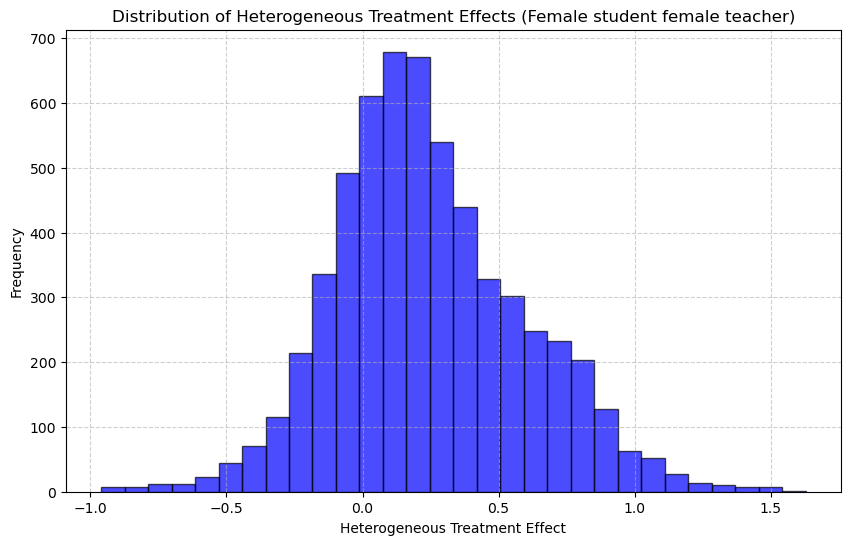

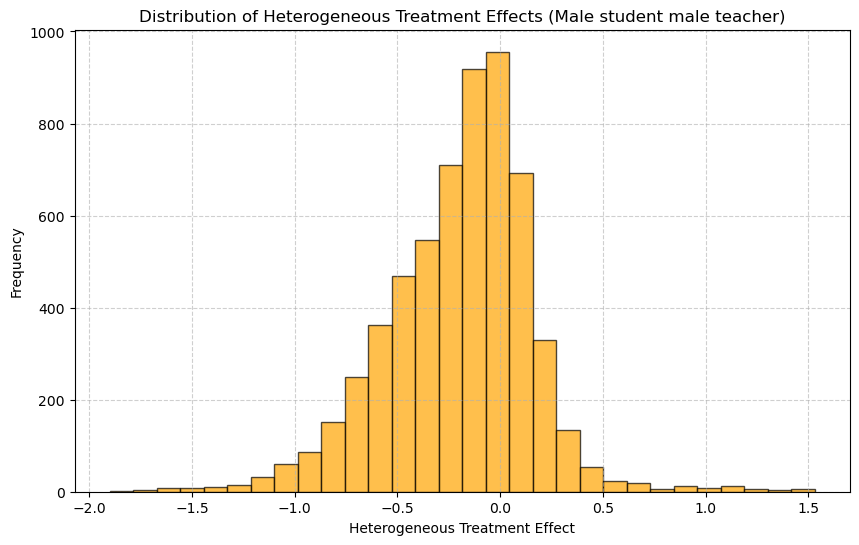

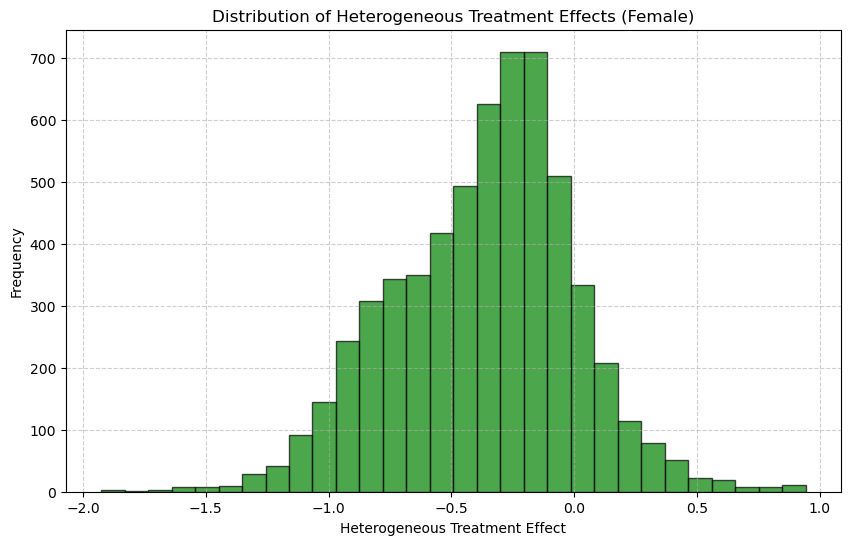

In [52]:
hete_effects = grf.predict(X_combined)  # Shape: (n_samples, n_treatments)

# Define the mapping dictionary for English names
treatment_mapping = {
    0: "Female student female teacher",
    1: "Male student male teacher",
    2: "Female"
}

# Define a color palette for consistency with the line plots
colors = ['blue', 'orange', 'green']

# Plot histograms for each treatment
for t in range(hete_effects.shape[1]):  # Iterate over treatments
    treatment_effects = hete_effects[:, t]  # Extract effects for the chosen treatment

    # Create the histogram
    plt.figure(figsize=(10, 6))
    plt.hist(
        treatment_effects, 
        bins=30, 
        edgecolor='k', 
        alpha=0.7, 
        color=colors[t]  # Match color with line plots
    )
    plt.xlabel("Heterogeneous Treatment Effect")
    plt.ylabel("Frequency")
    plt.title(f"Distribution of Heterogeneous Treatment Effects ({treatment_mapping[t]})")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()


In [48]:
# Assuming `gender` is a column in your dataset
mss_indices = (train['m_same_sex'] == 1).values
fss_indices = (train['f_same_sex'] == 1).values

# Predict heterogeneous treatment effects
hete_effects = grf.predict(X_combined)  # Shape: (n_samples, n_treatments)

# Extract effects for each subgroup
male_effects = hete_effects[mss_indices]
female_effects = hete_effects[fss_indices]

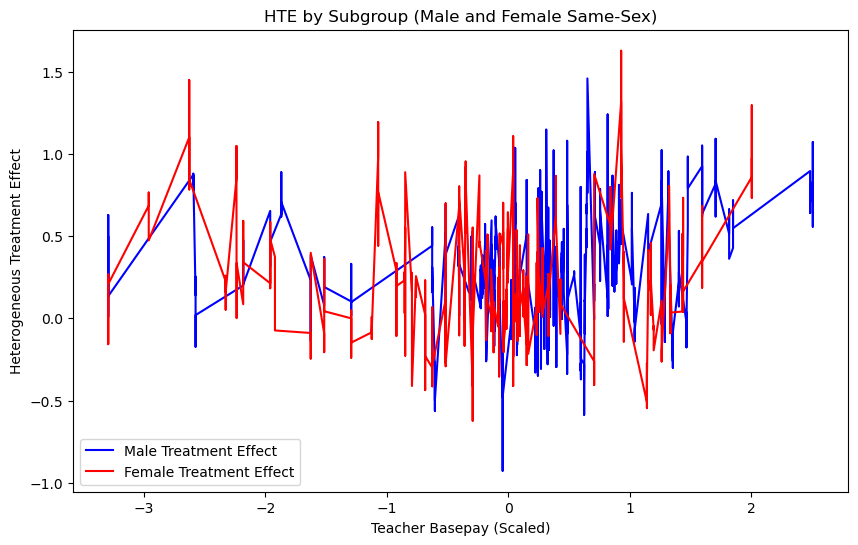

In [49]:
# Sort male subgroup
male_X = X_combined[mss_indices, :]  # Subset of X_combined for male same-sex group
sorted_indices_male = np.argsort(male_X[:, 0])  # Sort based on the first feature
X_male_sorted = male_X[sorted_indices_male, 0]  # Sorted first feature
male_effects_sorted = male_effects[sorted_indices_male]  # Sorted effects

# Sort female subgroup
female_X = X_combined[fss_indices, :]  # Subset of X_combined for female same-sex group
sorted_indices_female = np.argsort(female_X[:, 0])  # Sort based on the first feature
X_female_sorted = female_X[sorted_indices_female, 0]  # Sorted first feature
female_effects_sorted = female_effects[sorted_indices_female]  # Sorted effects

# Plot treatment effects for each subgroup
plt.figure(figsize=(10, 6))
plt.plot(X_male_sorted, male_effects_sorted[:, 0], label="Male Treatment Effect", color="blue")
plt.plot(X_female_sorted, female_effects_sorted[:, 0], label="Female Treatment Effect", color="red")
plt.xlabel("Teacher Basepay (Scaled)")
plt.ylabel("Heterogeneous Treatment Effect")
plt.title("HTE by Subgroup (Male and Female Same-Sex)")
plt.legend()
plt.show()


In [50]:
# Sort data for smooth line plot
sorted_indices = np.argsort(X_combined[:, 0])  # Assuming X_combined[:, 0] is `teacher_basepay`
X_sorted = X_combined[sorted_indices, 0]
male_effects_sorted = male_effects[sorted_indices]
female_effects_sorted = female_effects[sorted_indices]

# Plot the trends
plt.figure(figsize=(10, 6))
plt.plot(X_sorted, male_effects_sorted[:, 0], label="Male Treatment Effect", color="blue")
plt.plot(X_sorted, female_effects_sorted[:, 0], label="Female Treatment Effect", color="red")
plt.xlabel("Teacher Basepay (Scaled)")
plt.ylabel("Heterogeneous Treatment Effect")
plt.title("HTE by Gender")
plt.legend()
plt.show()


IndexError: index 5302 is out of bounds for axis 0 with size 1690